In [1]:
import scanpy as sc
import os
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [2]:
path = '../../figures/2.comparison_between_datasets/with_regional_anno/'
files = os.listdir(path)
#files  =  [k for k in files if 'Yao' not in k]
files  =  [k for k in files if 'checkpoints' not in k]
files  =  [k for k in files if 'ST' not in k]

In [3]:
files2=list()
files2.append(files[6])
for el in files:
    if el not in files2:
        files2.append(el)

In [4]:
files=files2

In [5]:
files

['anno_scRNAseq.h5ad',
 'anno_allen_merFISH.h5ad',
 'anno_allen_smfish.h5ad',
 'anno_baristaseq.h5ad',
 'anno_exseq.h5ad',
 'anno_Hybriss.h5ad',
 'anno_osmfish.h5ad',
 'anno_starmap.h5ad',
 'anno_vizgen.h5ad',
 'anno_xenium.h5ad']

In [6]:
adata_dict = {}
for file in files: 
    print(file)
    adata = sc.read(path+file)
    try:
        adata.X = adata.X.toarray()
    except: 
        print('nothing to format')
    if file == 'anno_vizgen.h5ad':
        adata.X = adata.layers['raw']
    sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
    adata.var.index = adata.var.index.map(str.lower)
    nm=file.split('.')[0]
    adata_dict[nm[5:]] = adata

anno_scRNAseq.h5ad


/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


nothing to format
anno_allen_merFISH.h5ad
nothing to format
anno_allen_smfish.h5ad
nothing to format
anno_baristaseq.h5ad
nothing to format
anno_exseq.h5ad
nothing to format
anno_Hybriss.h5ad
nothing to format
anno_osmfish.h5ad
nothing to format
anno_starmap.h5ad
nothing to format
anno_vizgen.h5ad
nothing to format
anno_xenium.h5ad


In [7]:
var_names = []
for key in adata_dict.keys():
    print(key)
    print(len(adata_dict[key].var.index))
    list_ = list((adata_dict[key].var).index)
    list_ = [name.lower() for name in list_]
    var_names.append(list_)

scRNAseq
31053
allen_merFISH
267
allen_smfish
21
baristaseq
80
exseq
42
Hybriss
50
osmfish
33
starmap
1022
vizgen
483
xenium
284


In [8]:
minreads=1
repeated=[]
for variable in adata_dict['scRNAseq'].var.index:
    #print(variable)
    rep=0
    for key in adata_dict.keys():
        if variable in adata_dict[key].var.index: 
            rep = rep+1
    repeated.append(rep)

In [9]:
import pandas as pd
df = pd.DataFrame(repeated)
df.index= adata_dict['scRNAseq'].var.index

In [10]:
df_filt = df[df[0] > 4] #use only genes present in 4 datasets

In [11]:
color_dicitonary = {
'scRNAseq': 'black',
 'starmap': 'red',
 'allen_smfish': 'purple',
 'allen_merFISH': 'orangered',
 'Hybiss': 'forestgreen',
    'Hybriss': 'limegreen',
 'osmfish': '#FEE755',
 'seqFISH': 'cyan',
 'exseq': 'brown',
 'vizgen': '#E220F5',
 'baristaseq': '#FEAA55',
 'xenium': 'steelblue'  
                   }

In [12]:
adata_dict.keys()

dict_keys(['scRNAseq', 'allen_merFISH', 'allen_smfish', 'baristaseq', 'exseq', 'Hybriss', 'osmfish', 'starmap', 'vizgen', 'xenium'])

In [13]:
adata_dict['xenium'].X=adata_dict['xenium'].layers['raw']

0it [00:00, ?it/s]

scRNAseq
allen_merFISH
allen_smfish
exseq
starmap
xenium


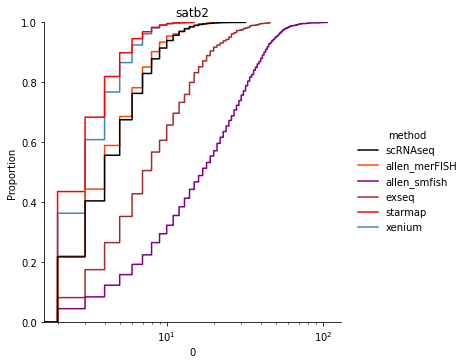

1it [00:01,  1.77s/it]

scRNAseq
allen_merFISH
allen_smfish
exseq
starmap
xenium


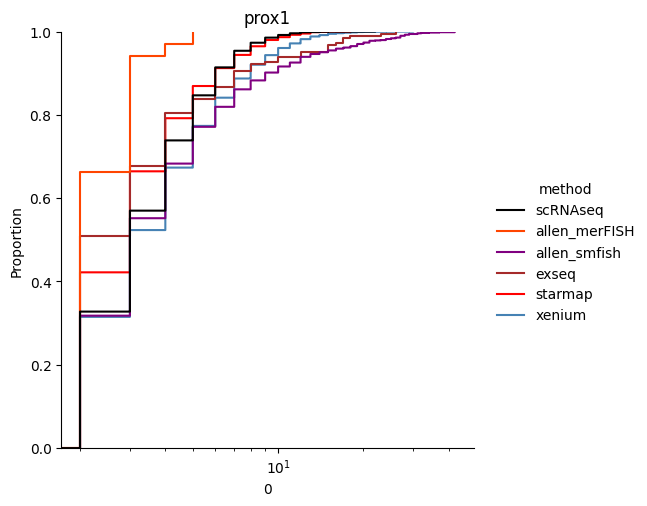

2it [00:02,  1.27s/it]

scRNAseq
allen_merFISH
Hybriss
osmfish
starmap


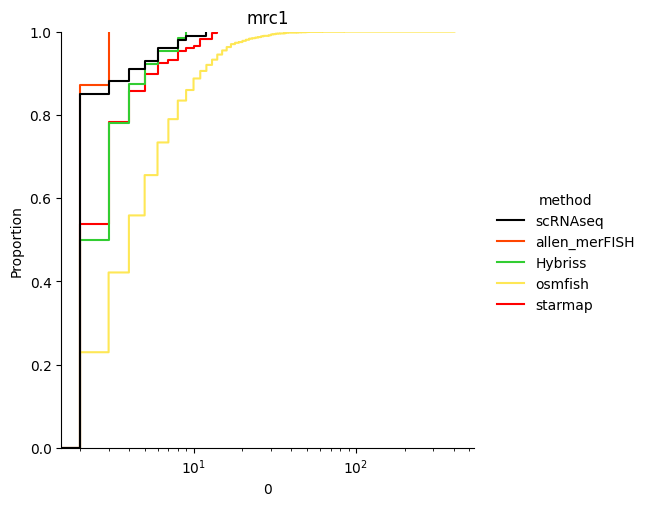

3it [00:03,  1.00s/it]

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
Hybriss
osmfish
starmap
xenium


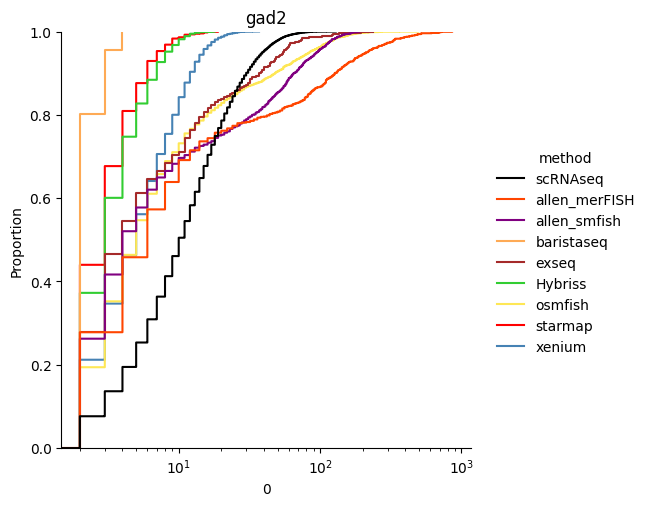

4it [00:04,  1.06it/s]

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
starmap


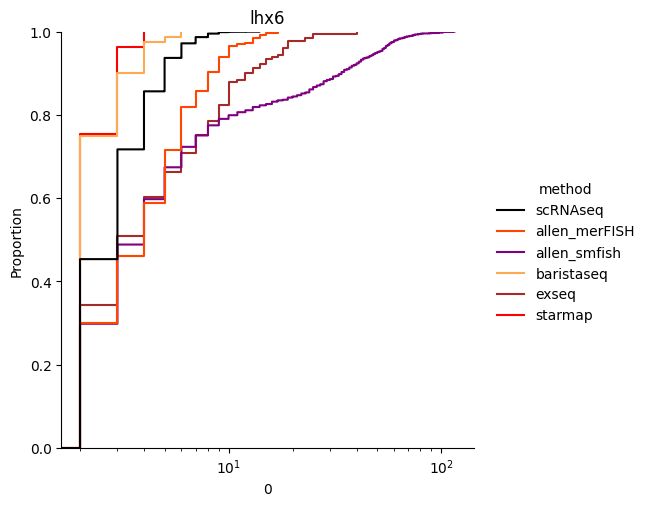

5it [00:04,  1.15it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
starmap
vizgen
xenium


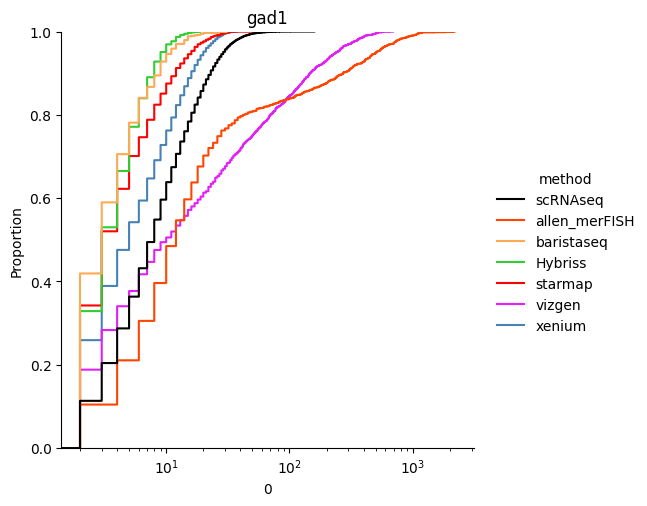

6it [00:05,  1.17it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
osmfish
starmap
xenium


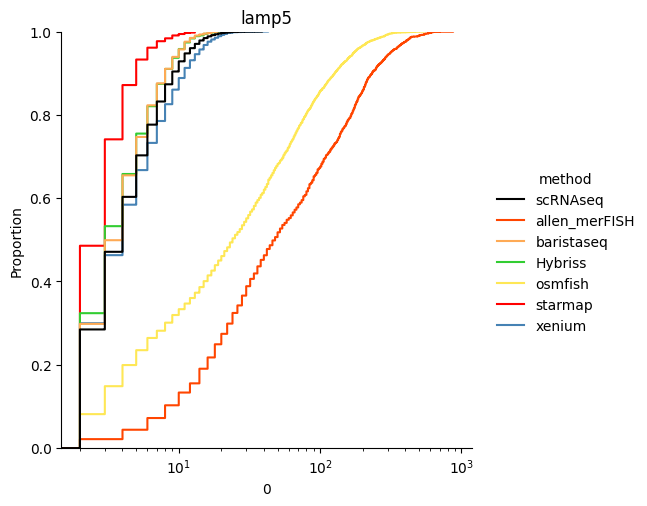

7it [00:06,  1.17it/s]

scRNAseq
allen_merFISH
baristaseq
exseq
Hybriss
osmfish
starmap
vizgen
xenium


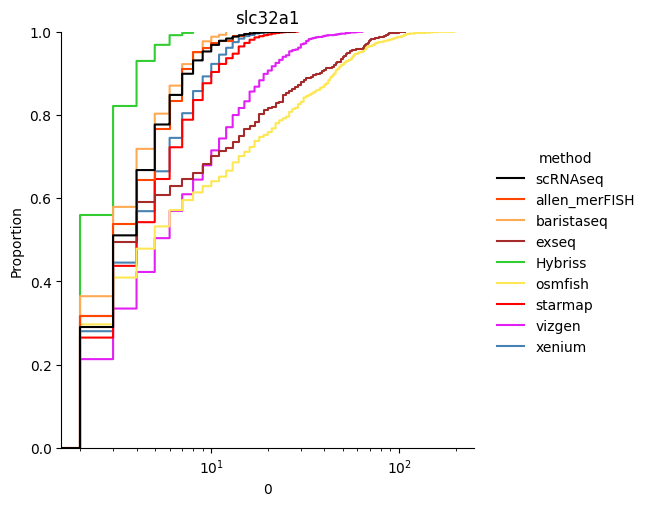

8it [00:07,  1.20it/s]

scRNAseq
baristaseq
Hybriss
osmfish
starmap
xenium


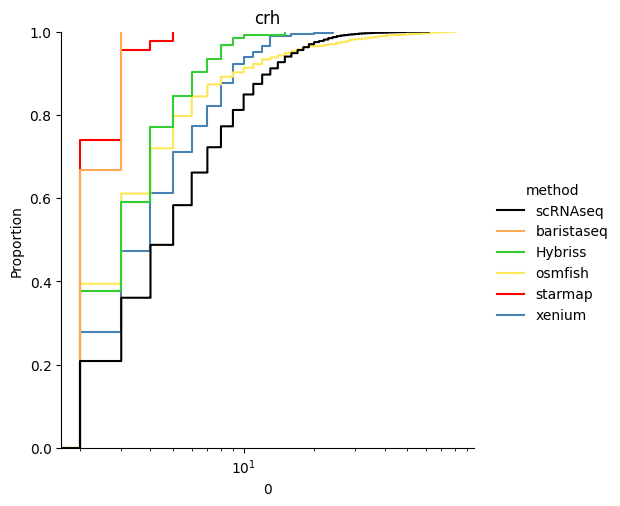

9it [00:08,  1.23it/s]

scRNAseq
baristaseq
exseq
starmap
xenium


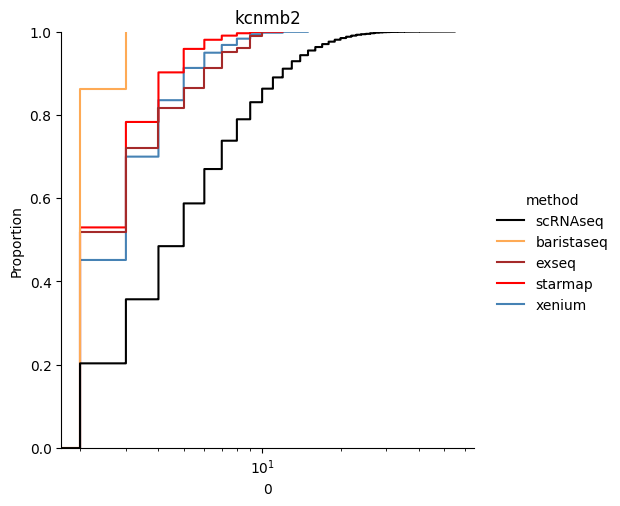

10it [00:09,  1.24it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


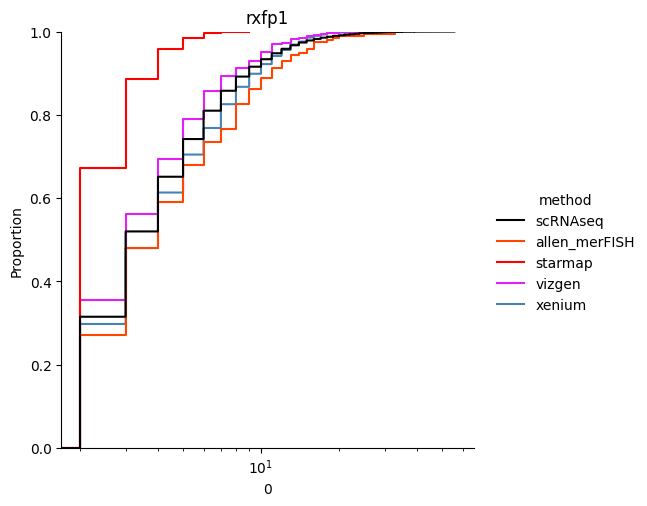

11it [00:09,  1.29it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


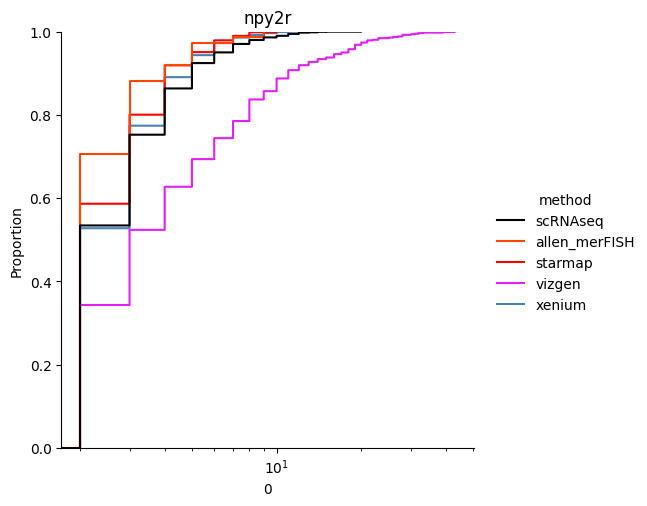

12it [00:10,  1.31it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
osmfish
starmap
xenium


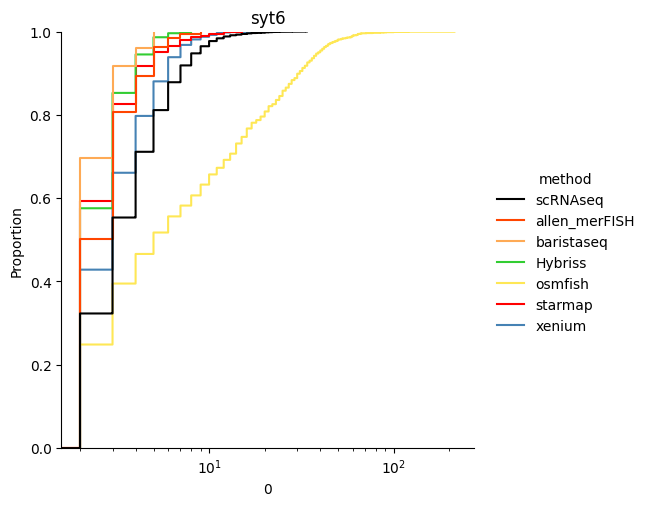

13it [00:11,  1.25it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
starmap
xenium


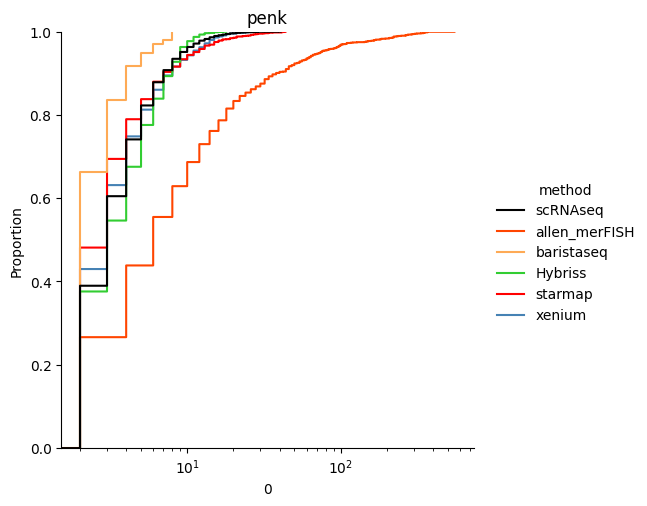

14it [00:12,  1.26it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
xenium


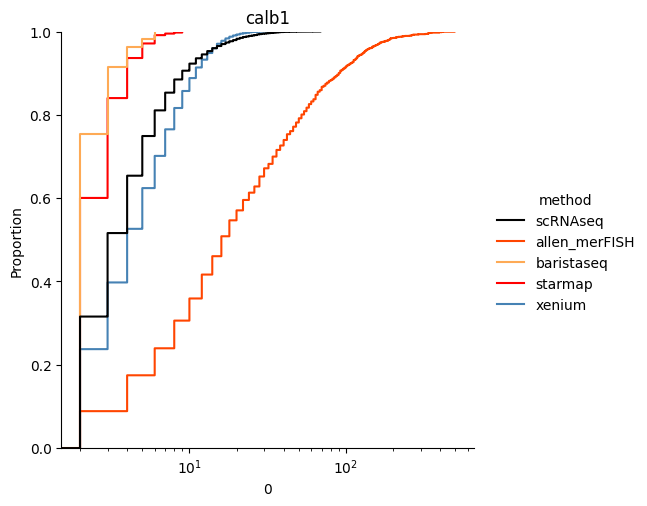

15it [00:12,  1.23it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
osmfish
starmap
vizgen


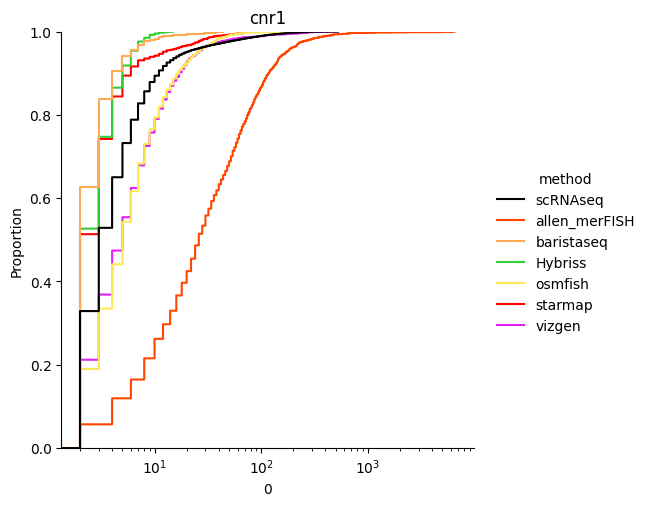

16it [00:13,  1.23it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
xenium


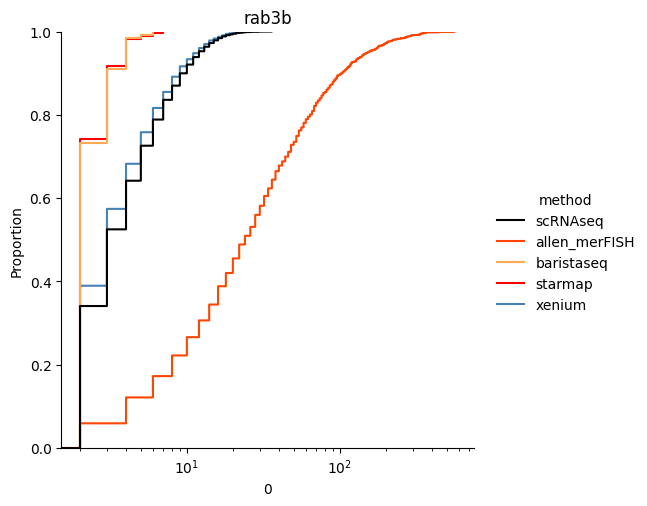

17it [00:14,  1.25it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
xenium


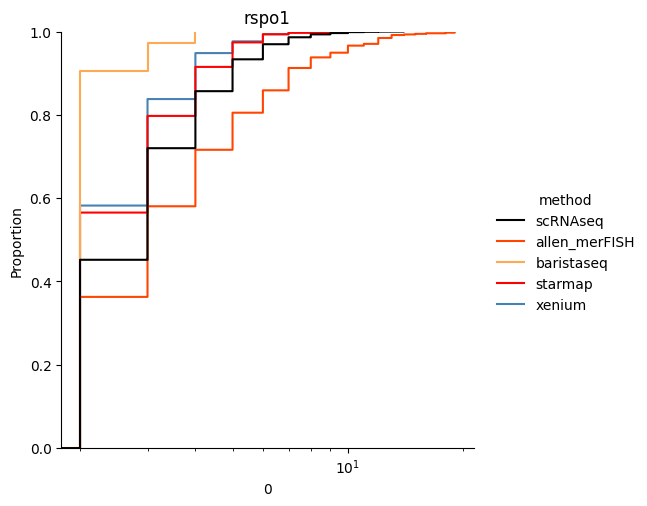

18it [00:15,  1.30it/s]

scRNAseq
allen_merFISH
allen_smfish
exseq
starmap
xenium


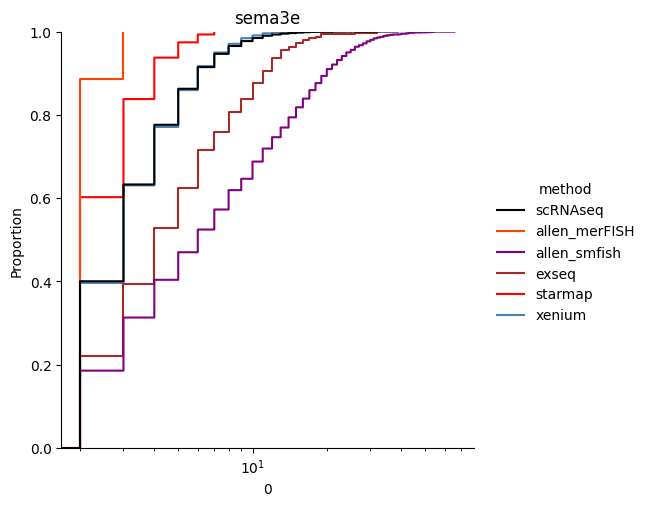

19it [00:16,  1.28it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
osmfish
starmap
vizgen
xenium


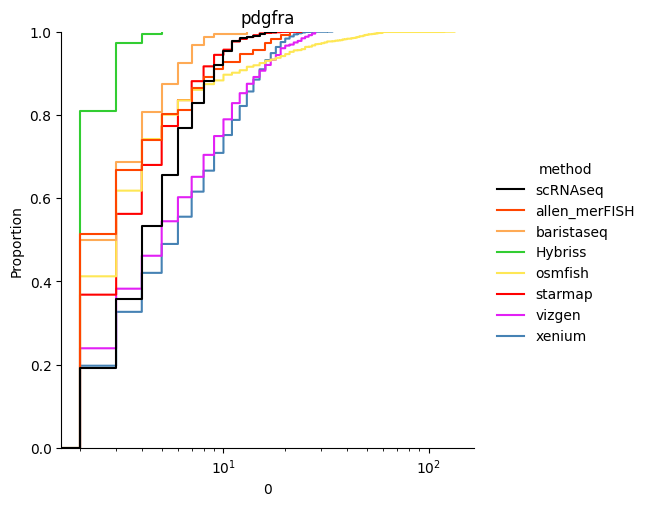

20it [00:16,  1.28it/s]

scRNAseq
allen_merFISH
allen_smfish
exseq
starmap
xenium


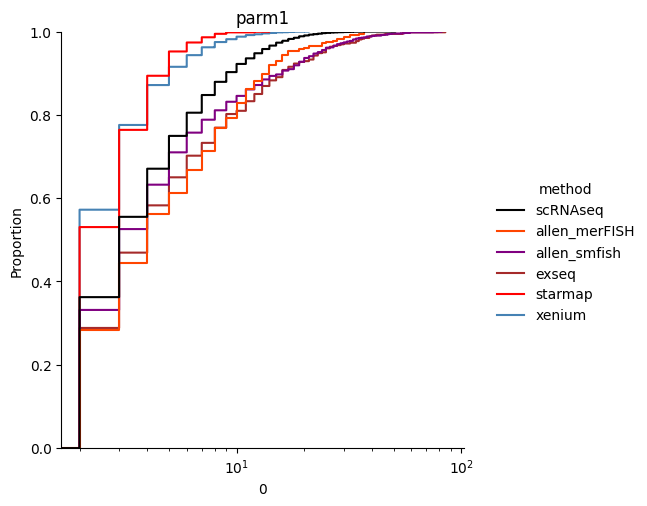

21it [00:17,  1.25it/s]

scRNAseq
allen_merFISH
allen_smfish
exseq
starmap
xenium


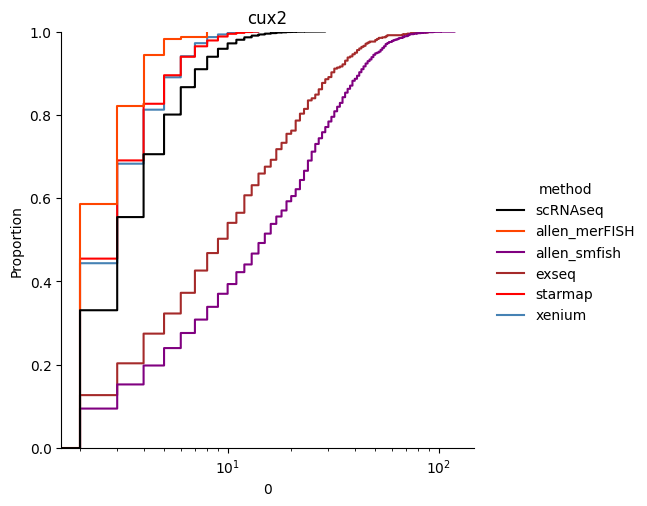

22it [00:18,  1.25it/s]

scRNAseq
allen_merFISH
Hybriss
osmfish
starmap
vizgen


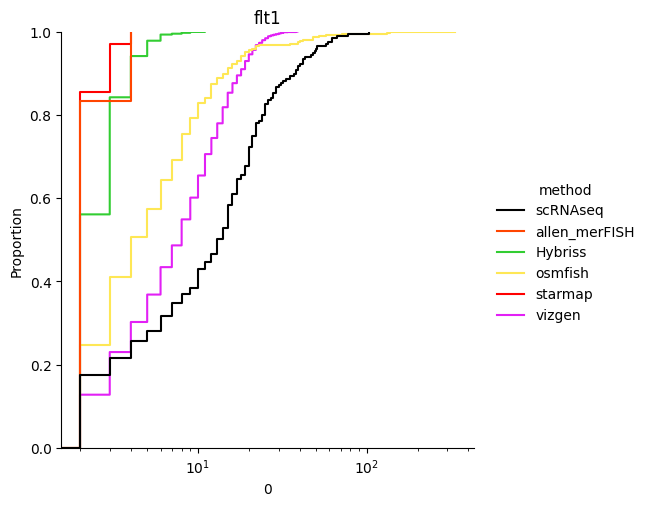

23it [00:19,  1.28it/s]

scRNAseq
allen_merFISH
allen_smfish
exseq
xenium


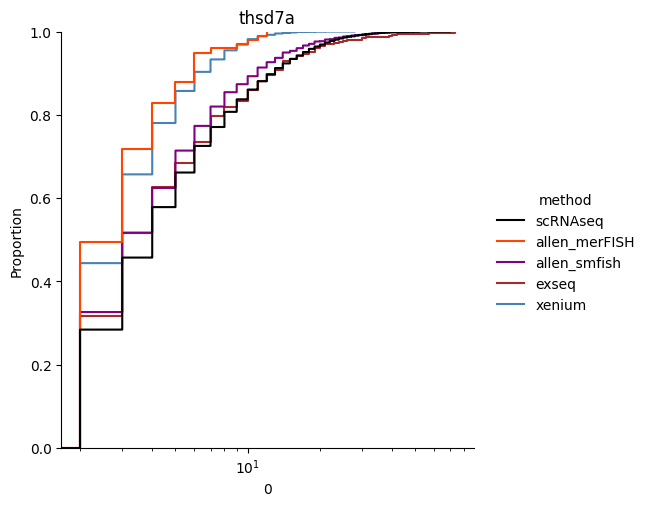

24it [00:19,  1.30it/s]

scRNAseq
allen_merFISH
allen_smfish
exseq
starmap
xenium


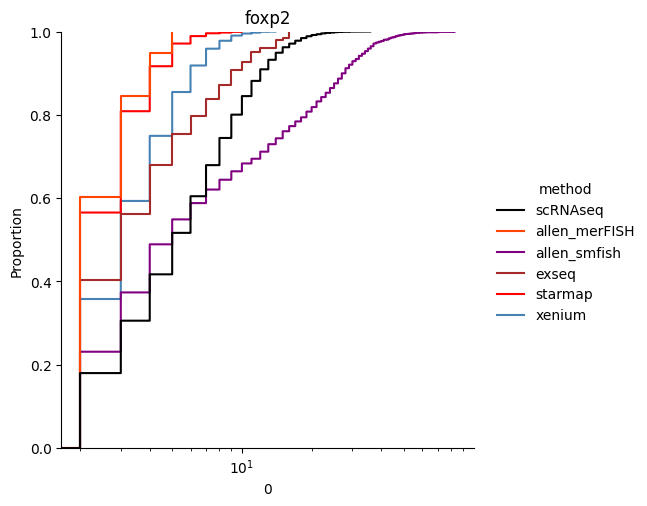

25it [00:20,  1.31it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


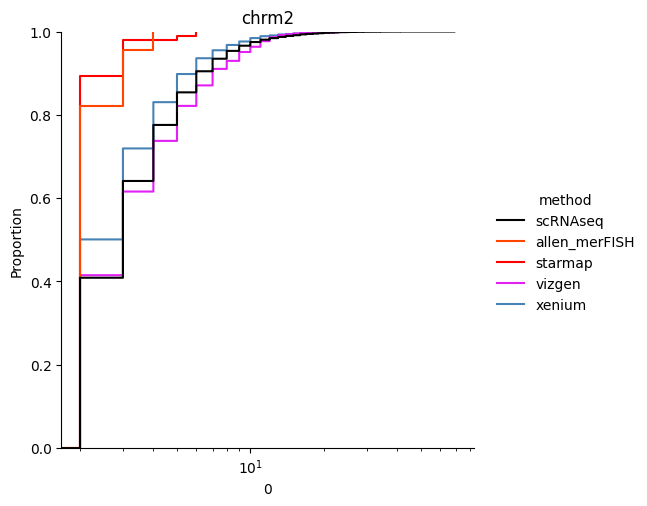

26it [00:21,  1.28it/s]

scRNAseq
Hybriss
osmfish
starmap
xenium


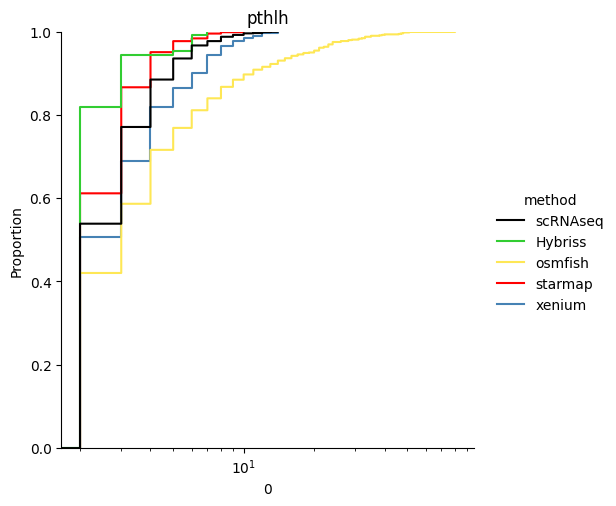

27it [00:22,  1.14it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
starmap
vizgen
xenium


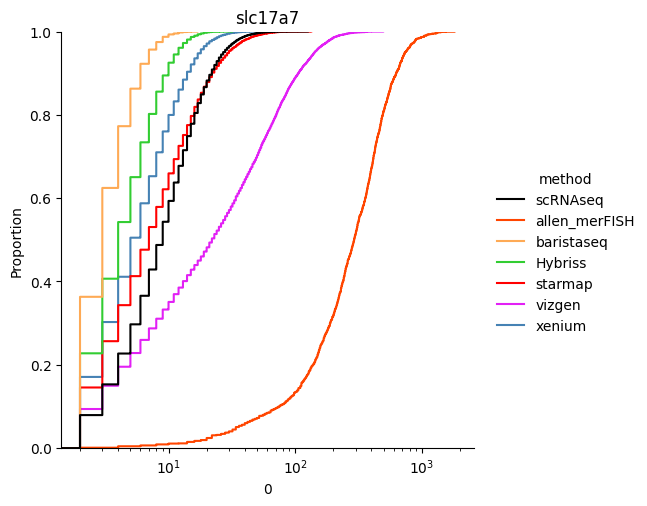

28it [00:23,  1.00s/it]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


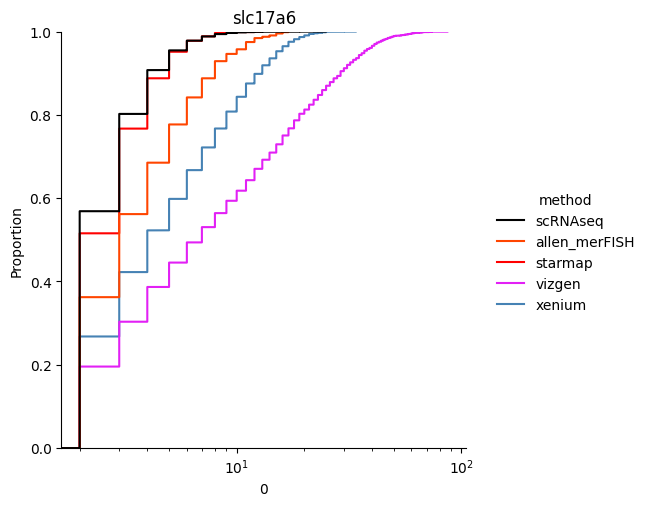

29it [00:24,  1.05it/s]

scRNAseq
allen_merFISH
exseq
starmap
xenium


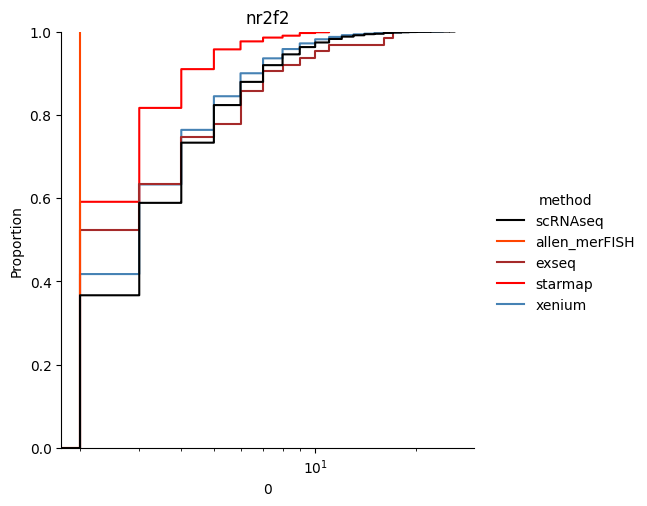

30it [00:25,  1.13it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
vizgen
xenium


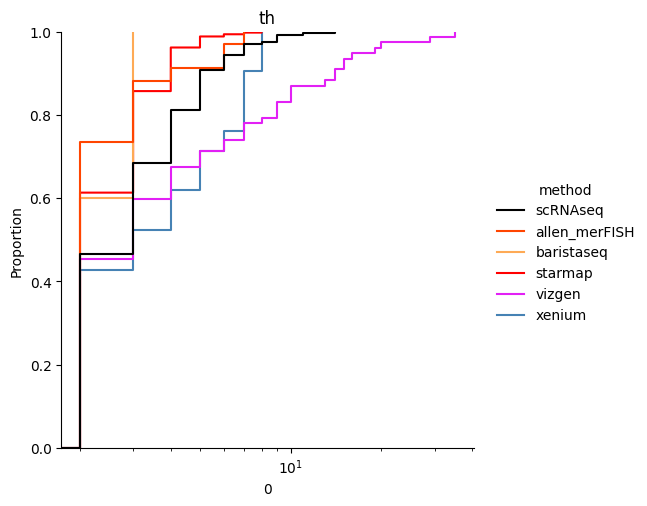

31it [00:26,  1.16it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
osmfish
starmap
xenium


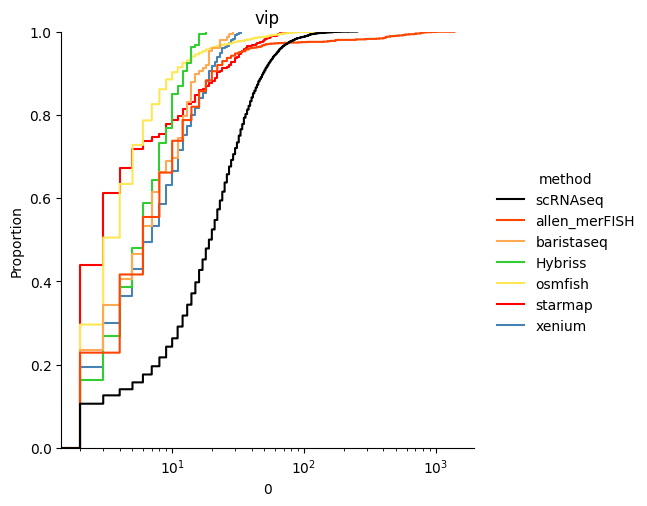

32it [00:27,  1.14it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
vizgen


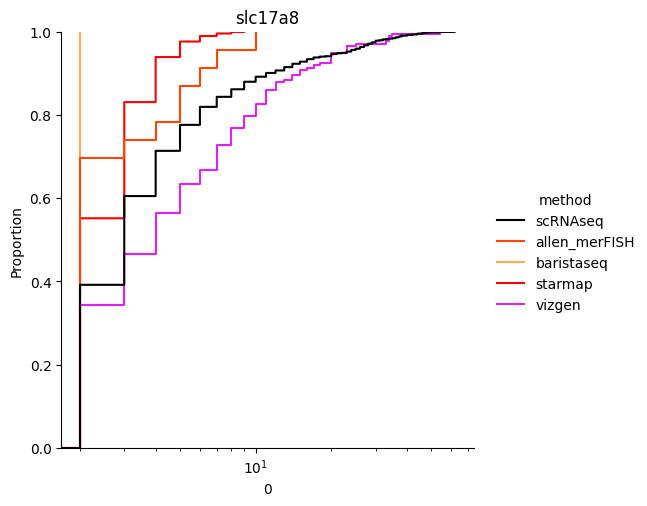

33it [00:28,  1.10it/s]

scRNAseq
allen_merFISH
Hybriss
starmap
xenium


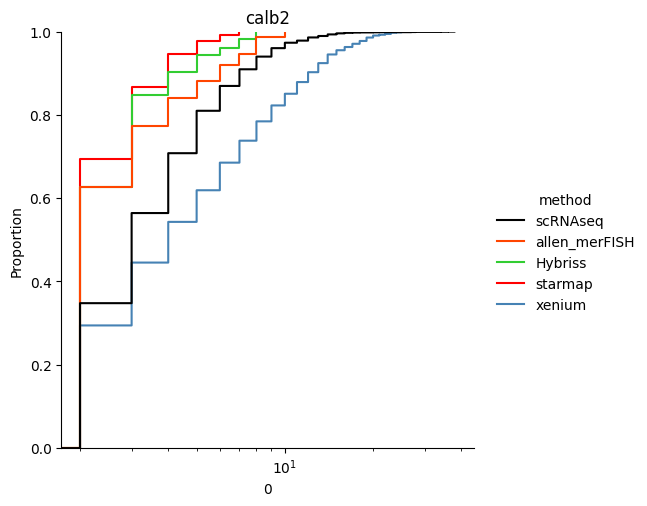

34it [00:28,  1.17it/s]

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
starmap
xenium


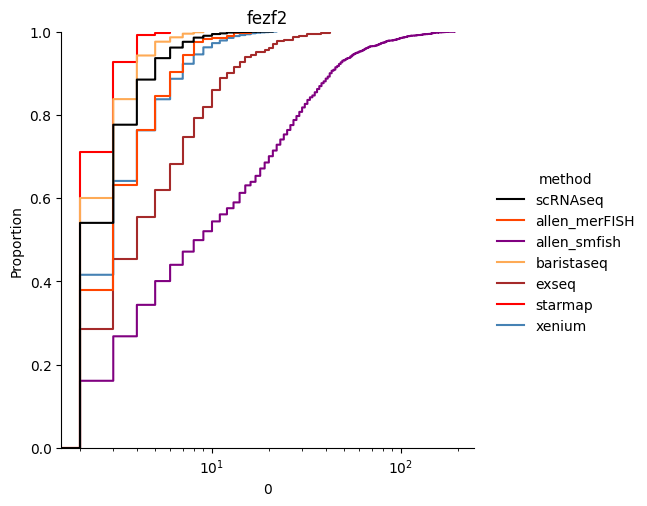

35it [00:29,  1.19it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


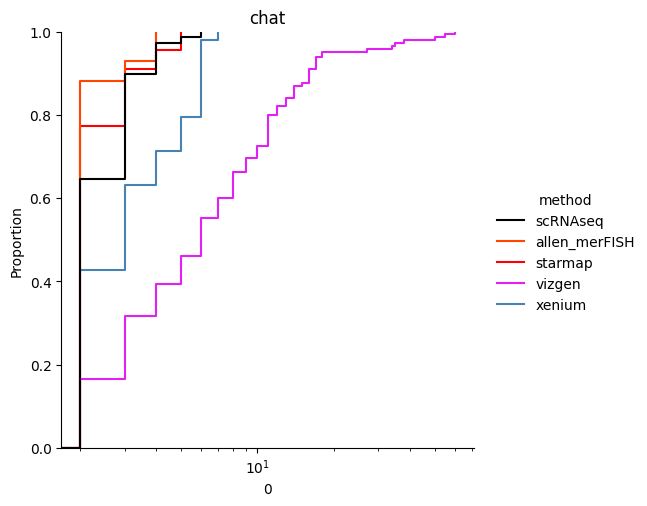

36it [00:30,  1.24it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
xenium


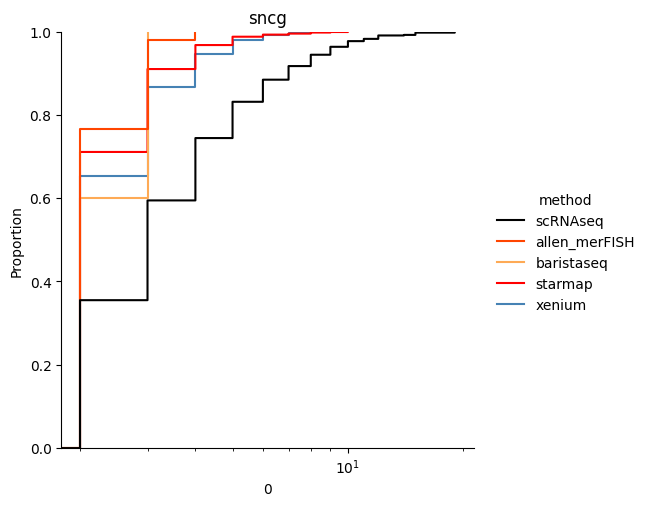

37it [00:31,  1.30it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


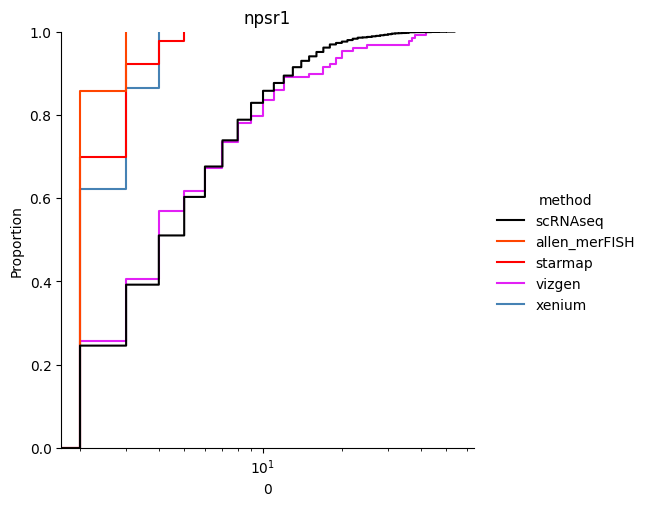

38it [00:31,  1.28it/s]

scRNAseq
allen_merFISH
Hybriss
osmfish
starmap


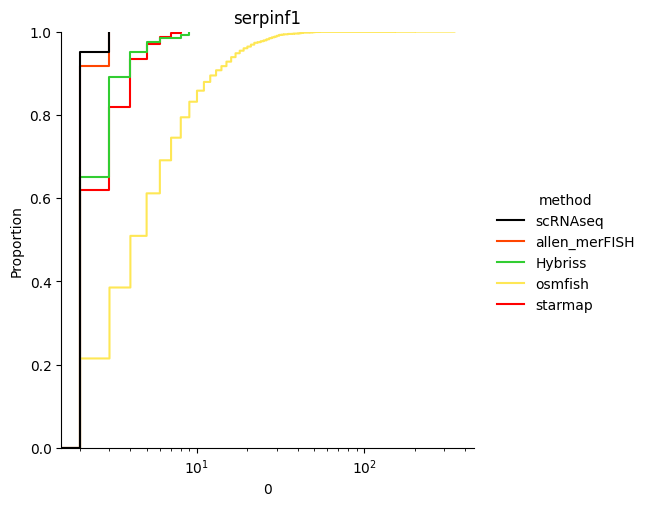

39it [00:32,  1.16it/s]

scRNAseq
allen_merFISH
Hybriss
osmfish
starmap


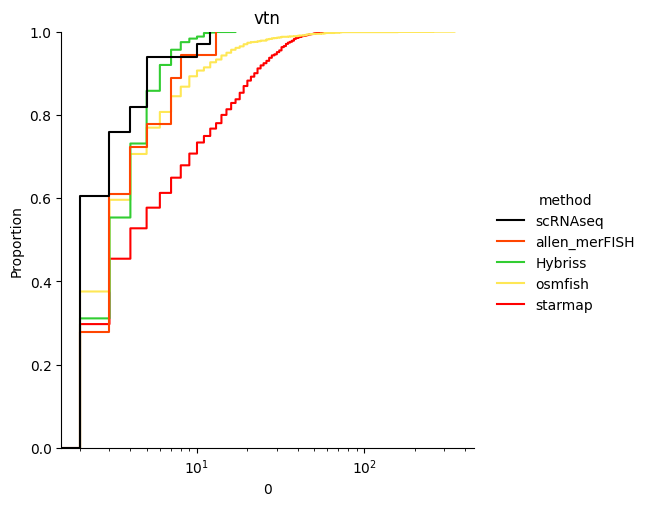

40it [00:33,  1.13it/s]

scRNAseq
allen_merFISH
Hybriss
osmfish
starmap
vizgen
xenium


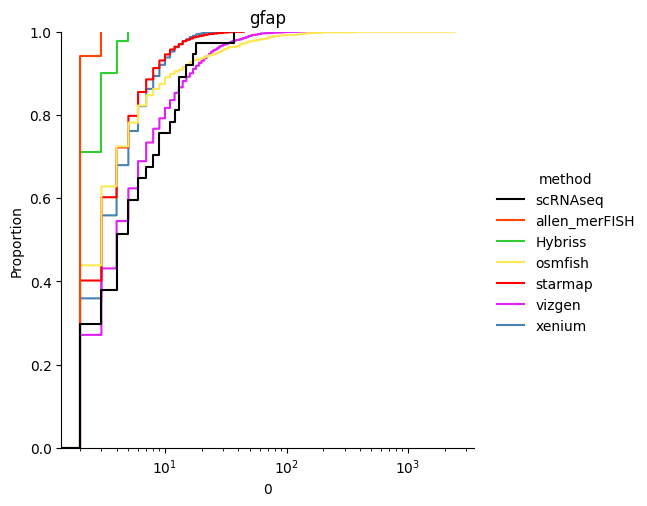

41it [00:34,  1.12it/s]

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
Hybriss
starmap
xenium


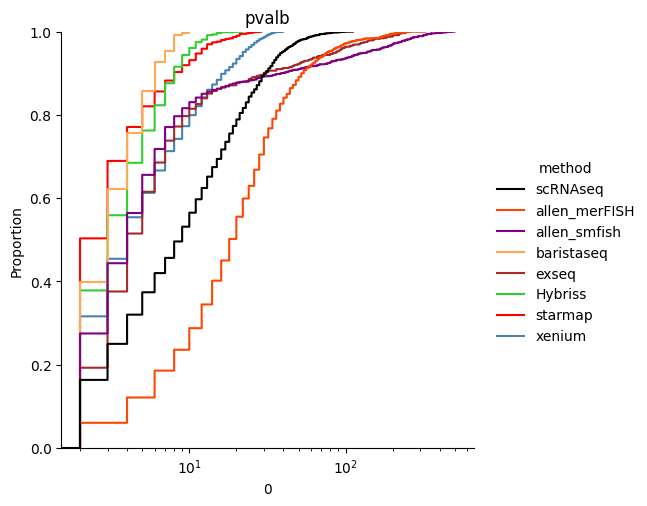

42it [00:35,  1.16it/s]

scRNAseq
allen_merFISH
Hybriss
osmfish
xenium


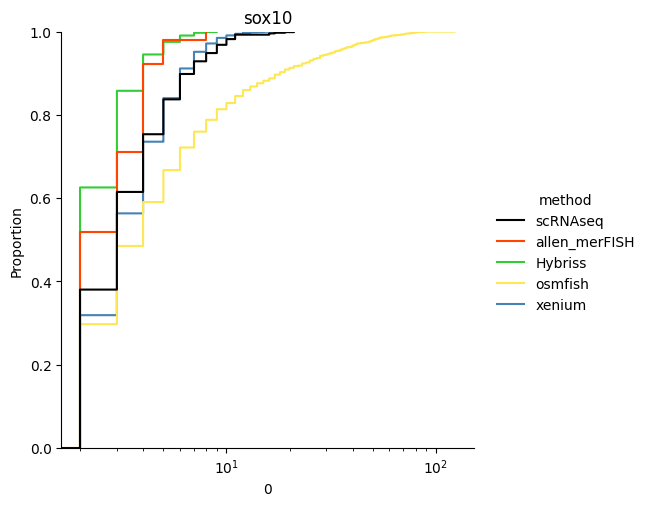

43it [00:36,  1.20it/s]

scRNAseq
allen_merFISH
baristaseq
starmap
xenium


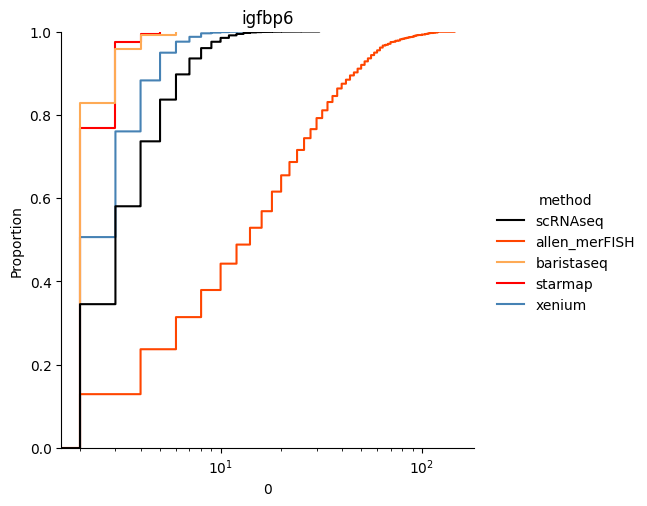

44it [00:37,  1.17it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


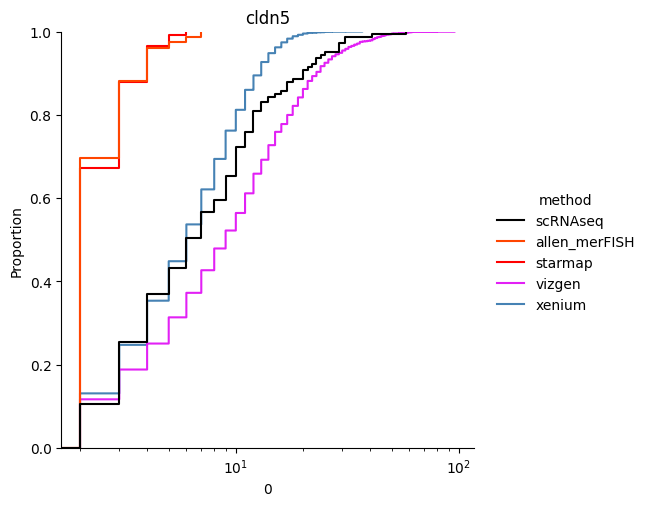

45it [00:38,  1.18it/s]

scRNAseq
allen_merFISH
baristaseq
Hybriss
starmap
xenium


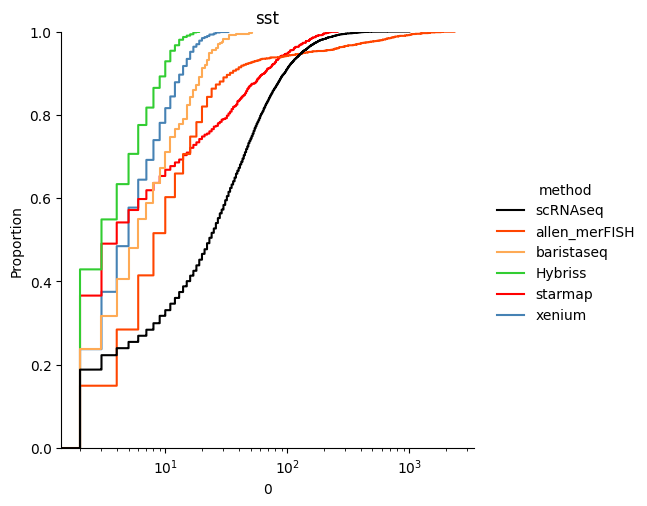

46it [00:38,  1.20it/s]

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
starmap
xenium


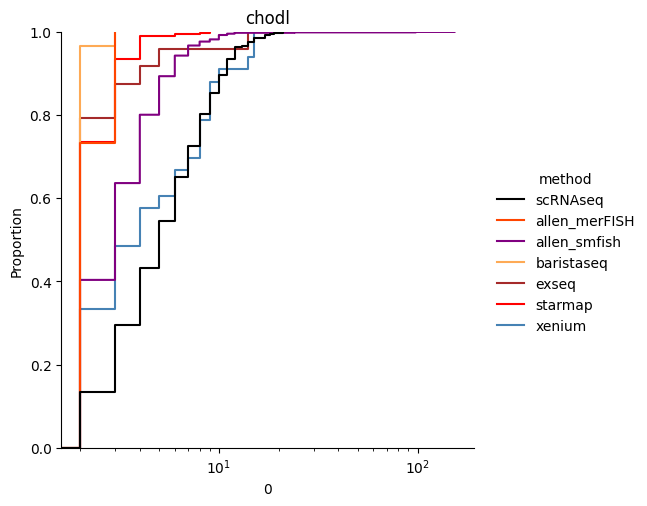

47it [00:39,  1.24it/s]

scRNAseq
allen_smfish
exseq
starmap
xenium


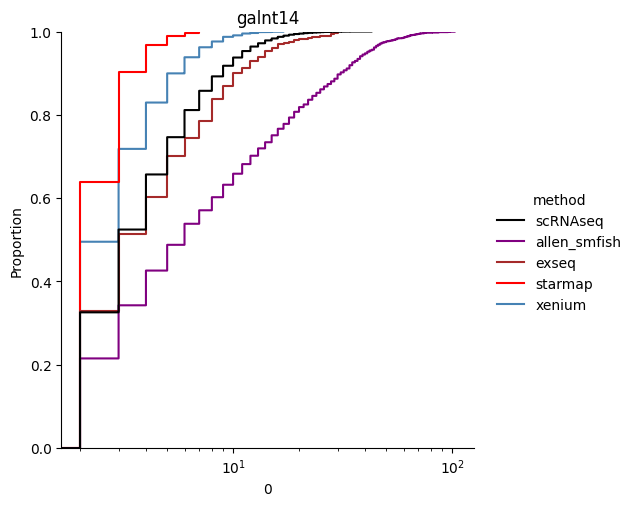

48it [00:40,  1.24it/s]

scRNAseq
allen_merFISH
starmap
vizgen
xenium


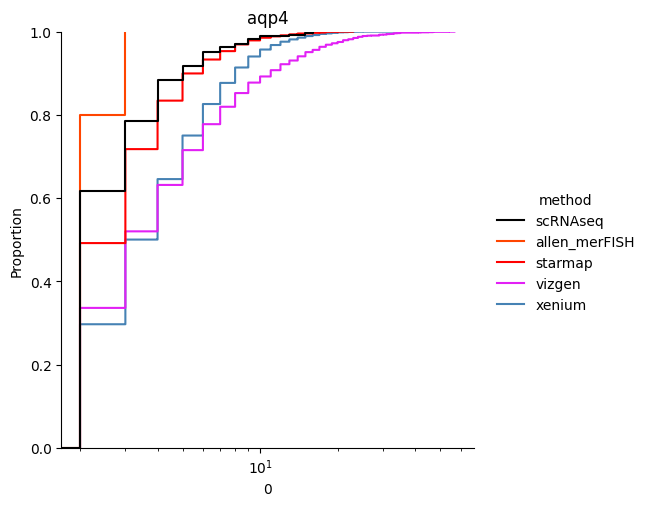

49it [00:41,  1.25it/s]

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
Hybriss
osmfish
starmap
xenium


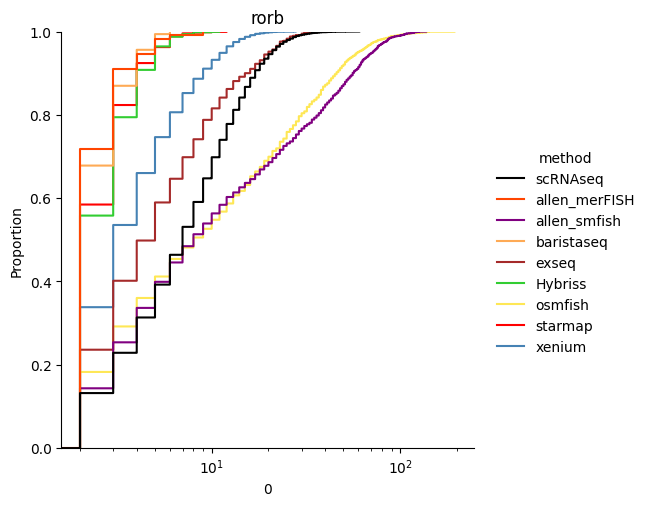

50it [00:42,  1.20it/s]

scRNAseq
allen_merFISH
Hybriss
osmfish
starmap
xenium


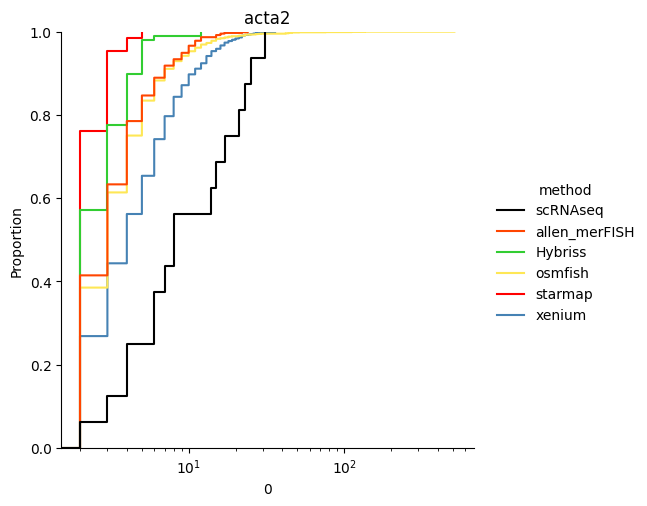

51it [00:43,  1.19it/s]


In [14]:
means  = {
    'scRNAseq': [],
     'starmap': [],
     'allen_smfish': [],
     'allen_merFISH': [],
     'Hybiss': [],
    'Hybriss': [],
     'osmfish':[],
     'seqFISH': [],
     'exseq': [],
     'vizgen':[],
     'baristaseq': [],
     'xenium': [],
}
for i,gene in tqdm(enumerate(df_filt.index)):
    RNA_S=[]
    for key in adata_dict.keys():
        if key == 'scRNAseq':
            rna_subset = adata_dict[key][:, adata_dict[key].var.index == (gene)]
            rna_median = np.median(list(rna_subset.X[rna_subset.X > minreads]))
            
        if gene in adata_dict[key].var.index:
            print(key)
            subset = adata_dict[key][:, adata_dict[key].var.index == (gene)]
            median_exp = np.median(subset.X[subset.X > minreads])
            #median_exp/rna_median
            df_int = pd.DataFrame(subset.X[subset.X > minreads])
            df_int['method'] = key
            df_int[0].mean()/rna_median
            RNA_S.append(df_int)
            means[key].append(df_int[0].median()/rna_median)
        RNA_df = pd.concat(RNA_S)
        RNA_df=RNA_df.reset_index()
        
        #means[key].append(df_int[0].mean()/rna_median)
    
    RNA_df['color'] = RNA_df.method.map(color_dicitonary)
    sns.displot(data=RNA_df,x=RNA_df[0],hue='method',kind='ecdf',log_scale=True, palette=list(RNA_df['color'].unique()))
    plt.title(gene)
    plt.show()

In [15]:
def combine_med(medians,tag):
    mm=pd.DataFrame(medians,columns=['ratio'])
    mm['method']=tag
    return mm

In [16]:
df_list = []
for key in means.keys():
    print(key)
    mm = combine_med(means[key], tag = key)
    df_list.append(mm)
df_con = pd.concat(df_list)

scRNAseq
starmap
allen_smfish
allen_merFISH
Hybiss
Hybriss
osmfish
seqFISH
exseq
vizgen
baristaseq
xenium


In [17]:
df_con['color'] = df_con.method.map(color_dicitonary)

In [18]:
df_con['method']

0     scRNAseq
1     scRNAseq
2     scRNAseq
3     scRNAseq
4     scRNAseq
        ...   
39      xenium
40      xenium
41      xenium
42      xenium
43      xenium
Name: method, Length: 304, dtype: object

In [19]:
# get min and maximum in Xenium

In [21]:
df_xen=df_con.loc[df_con['method']=='xenium',:]

In [26]:
df_xen['ratio'].min()

0.277869

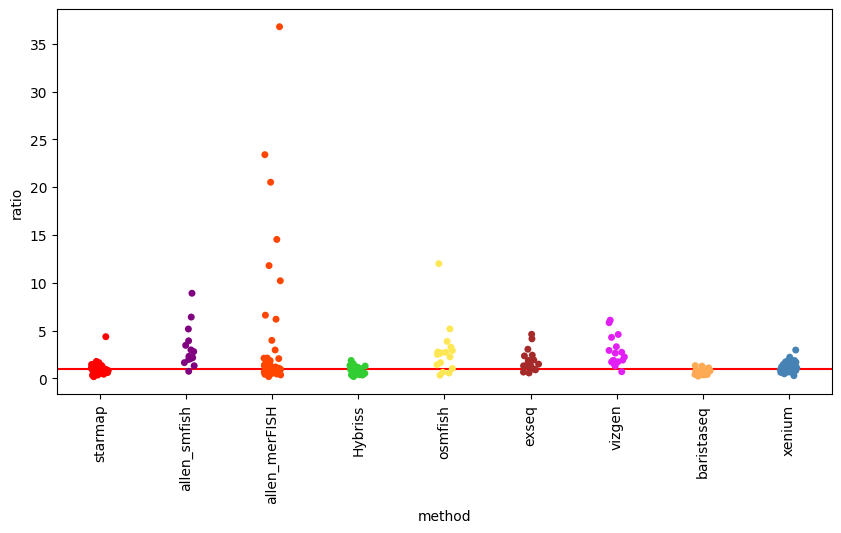

In [19]:
with plt.rc_context({'figure.figsize': (10, 5)}):
    sns.stripplot(x="method", y="ratio",
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'], palette=list(df_con.loc[df_con.method != 'scRNAseq','color'].unique()))
    #plt.ylim([0,10])
    plt.axhline(y = 1, color = 'r', linestyle = '-')
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.show()

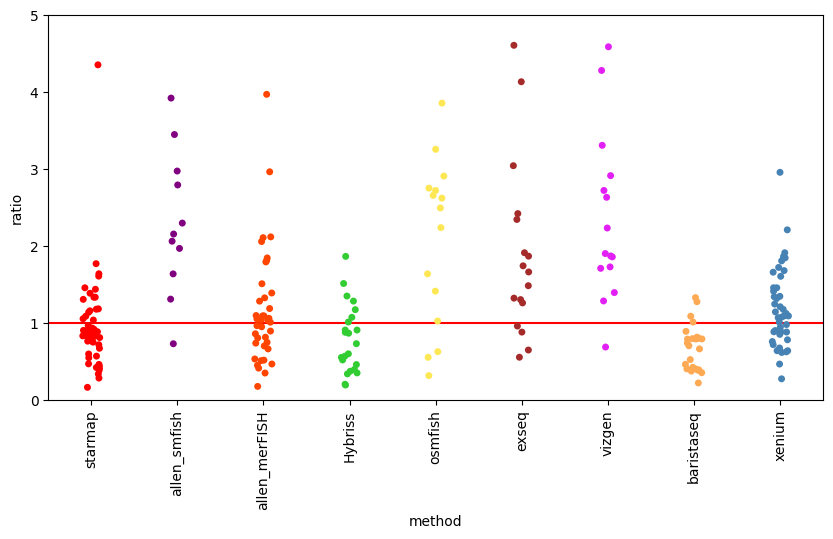

In [20]:
with plt.rc_context({'figure.figsize': (10, 5)}):
    sns.stripplot(x="method", y="ratio",
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'], palette=list(df_con.loc[df_con.method != 'scRNAseq','color'].unique()))
    plt.ylim([0,5])
    plt.axhline(y = 1, color = 'r', linestyle = '-')
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.show()

In [21]:
df_con=df_con.sort_values(by='ratio')

In [22]:
df_con.loc[df_con.method != 'scRNAseq','color'].unique()

array(['red', 'orangered', 'limegreen', '#FEAA55', 'steelblue', '#FEE755',
       'brown', '#E220F5', 'purple'], dtype=object)

In [ ]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=500, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
with plt.rc_context({'figure.figsize': (10, 5)}):
    f, ax = plt.subplots(figsize=(10, 5))
    ax.set(yscale="log")

    sns.stripplot(x="method", y="ratio",ax=ax,
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'], palette=list(df_con.loc[df_con.method != 'scRNAseq','color'].unique()),linewidths=0.2,edgecolor='black',s=4)
    sns.boxplot(x="method", y="ratio",ax=ax,
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'],palette=list(['white']),saturation=0.5,color='white', width=.5, fliersize=0)
#    plt.ylim([0,20])
    
#    plt.axhline(y = 1, color = '', linestyle = '-')
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.savefig('../../figures/2.comparison_between_datasets/ratio_per_tech.pdf',bbox_inches='tight')
    plt.show()

In [26]:
df_con['logratio']=list(np.log(df_con['ratio']))

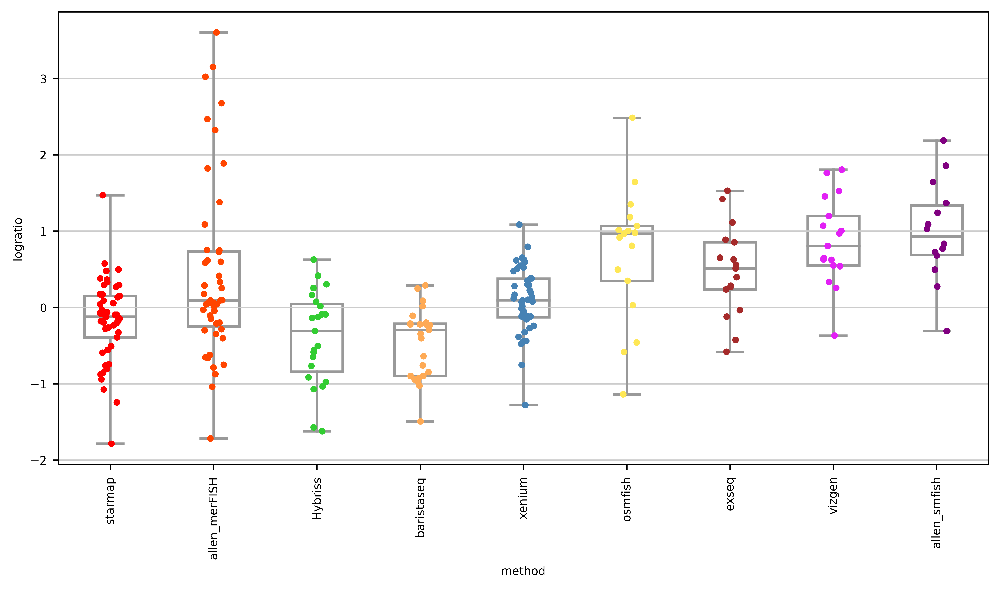

In [33]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=500, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
with plt.rc_context({'figure.figsize': (10, 5)}):
    f, ax = plt.subplots(figsize=(10, 5))
#    ax.set(yscale="log")
    sns.stripplot(x="method", y="logratio",ax=ax,
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'], palette=list(df_con.loc[df_con.method != 'scRNAseq','color'].unique()),linewidths=0.2,edgecolor='black',s=4)
    sns.boxplot(x="method", y="logratio",ax=ax,
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'],palette=list(['white']),saturation=0.5,color='white', width=.5, fliersize=0,whis=10)
#    plt.ylim([0,20])
    
#    plt.axhline(y = 1, color = '', linestyle = '-')
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.savefig('../../figures/2.comparison_between_datasets/ratio_per_tech_logratio.pdf',bbox_inches='tight')
    plt.show()

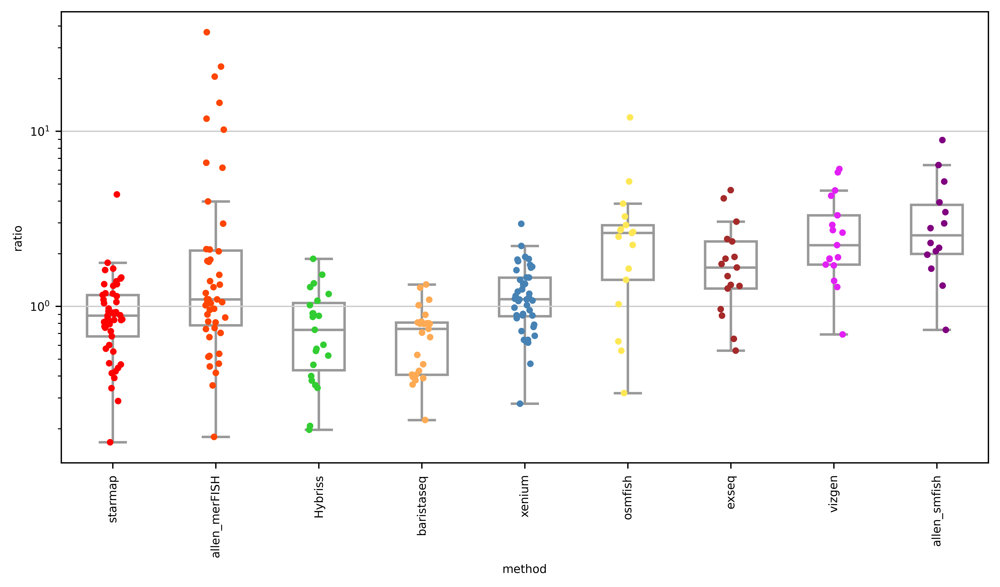

In [23]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=500, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
with plt.rc_context({'figure.figsize': (10, 5)}):
    f, ax = plt.subplots(figsize=(10, 5))
    ax.set(yscale="log")

    sns.stripplot(x="method", y="ratio",ax=ax,
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'], palette=list(df_con.loc[df_con.method != 'scRNAseq','color'].unique()),linewidths=0.2,edgecolor='black',s=4)
    sns.boxplot(x="method", y="ratio",ax=ax,
             # colormap="Set3",# order=clarity_ranking,
               data=df_con[df_con.method != 'scRNAseq'],palette=list(['white']),saturation=0.5,color='white', width=.5, fliersize=0)
#    plt.ylim([0,20])
    
#    plt.axhline(y = 1, color = '', linestyle = '-')
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.savefig('../../figures/2.comparison_between_datasets/ratio_per_tech.pdf',bbox_inches='tight')
    plt.show()

In [24]:
rna_median

8.0

In [26]:
df_int[0]

0        3.0
1        4.0
2        3.0
3        2.0
4        7.0
        ... 
1609     5.0
1610     4.0
1611    14.0
1612     5.0
1613     2.0
Name: 0, Length: 1614, dtype: float32

In [27]:
np.median(subset.X[subset.X > minreads])

ArrayView(4., dtype=float32)

In [28]:
adata_dict['xenium']=adata_dict['xenium'][adata_dict['xenium'].obs['region_level1'].isin(['CH'])]

In [35]:
rna_median

12.125

In [57]:

gall=[]
ratio=[]
exp=[]
exp_sc=[]
for i,gene in tqdm(enumerate(df_filt.index)):
    RNA_S=[]
    for key in adata_dict.keys():
        if key == 'scRNAseq':
            rna_subset = adata_dict[key][:, adata_dict[key].var.index == (gene)]
            rna_median = np.median(list(rna_subset.X[rna_subset.X > minreads]))
        if key== 'xenium': 
            if gene in adata_dict[key].var.index:
                print(key)
                subset = adata_dict[key][:, adata_dict[key].var.index == (gene)]
                median_exp = np.median(subset.X[subset.X > minreads])
                gall.append(gene)
                ratio.append(median_exp/rna_median)
                exp_sc.append(rna_median)
                exp.append(median_exp)
               
                

1it [00:00,  3.75it/s]

xenium


2it [00:00,  3.83it/s]

xenium


4it [00:00,  4.53it/s]

xenium


6it [00:01,  4.71it/s]

xenium


7it [00:01,  4.28it/s]

xenium


8it [00:01,  4.25it/s]

xenium


9it [00:02,  4.06it/s]

xenium


10it [00:02,  4.18it/s]

xenium


11it [00:02,  4.05it/s]

xenium


12it [00:02,  3.68it/s]

xenium


13it [00:03,  3.41it/s]

xenium


14it [00:03,  3.34it/s]

xenium


15it [00:03,  3.35it/s]

xenium


17it [00:04,  3.42it/s]

xenium


18it [00:04,  3.46it/s]

xenium


19it [00:04,  3.41it/s]

xenium


20it [00:05,  3.44it/s]

xenium


21it [00:05,  3.56it/s]

xenium


22it [00:05,  3.54it/s]

xenium


24it [00:06,  3.91it/s]

xenium


25it [00:06,  3.97it/s]

xenium


26it [00:06,  3.99it/s]

xenium


27it [00:07,  3.91it/s]

xenium


28it [00:07,  3.77it/s]

xenium


29it [00:07,  3.85it/s]

xenium


30it [00:07,  3.98it/s]

xenium


31it [00:08,  3.92it/s]

xenium


32it [00:08,  4.00it/s]

xenium


34it [00:08,  4.03it/s]

xenium


35it [00:09,  3.98it/s]

xenium


36it [00:09,  3.93it/s]

xenium


37it [00:09,  3.97it/s]

xenium


38it [00:09,  3.54it/s]

xenium


41it [00:10,  3.96it/s]

xenium


42it [00:10,  3.62it/s]

xenium


43it [00:11,  3.74it/s]

xenium


44it [00:11,  3.75it/s]

xenium


45it [00:11,  3.78it/s]

xenium


46it [00:11,  3.78it/s]

xenium


47it [00:12,  3.80it/s]

xenium


48it [00:12,  3.69it/s]

xenium


49it [00:12,  3.68it/s]

xenium


50it [00:13,  3.64it/s]

xenium


51it [00:13,  3.84it/s]

xenium


In [63]:
xenium_exp_ratio['ratio'].min()

ArrayView(0.2173913, dtype=float32)

In [59]:
xenium_exp_ratio=pd.DataFrame([gall,ratio,exp,exp_sc],index=['gene','ratio','exp','exp_sc']).transpose()

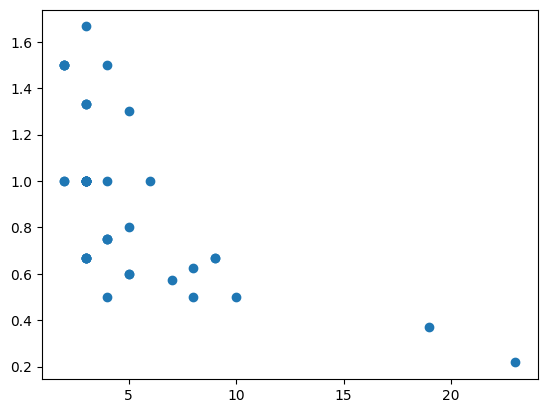

In [61]:
plt.scatter(xenium_exp_ratio['exp_sc'].astype(float),xenium_exp_ratio['ratio'].astype(float))

In [40]:
np.corrcoef(xenium_exp_ratio['exp_sc'].astype(float),xenium_exp_ratio['ratio'].astype(float))[0,1]

-0.6224514427433628

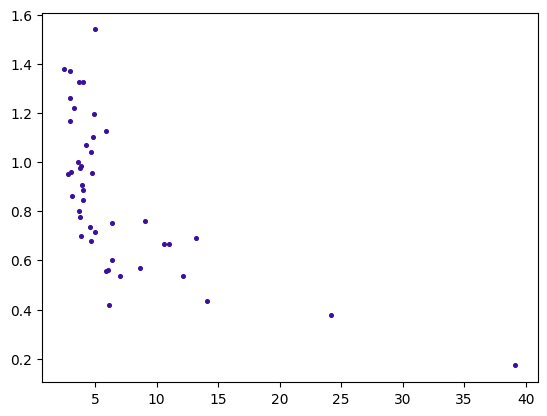

In [42]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.scatter(xenium_exp_ratio['exp_sc'].astype(float),xenium_exp_ratio['ratio'].astype(float),s=7,color='#3A119E')
plt.savefig('../../figures//2.comparison_between_datasets/ratio_vs_mean_expression_sc_rnaseq.pdf')

In [ ]:
adata_dick

scRNAseq
allen_merFISH
allen_smfish
baristaseq
exseq
Hybriss
osmfish
starmap
vizgen
xenium


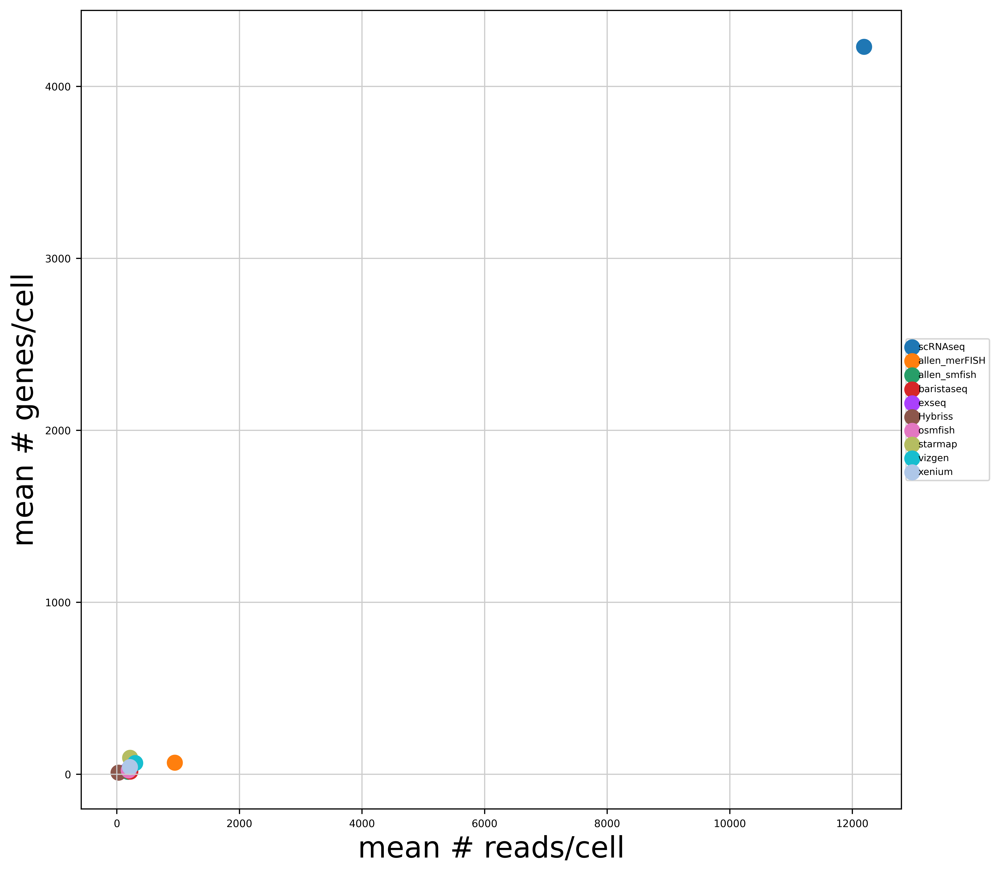

In [125]:
with plt.rc_context({'figure.figsize': (10, 10)}):
    #ax = plt.axes(projection='2d')
    for key in adata_dict.keys():
        if key == 'singleCellRNAseq':
                continue
        print(key)
        adata_int = adata_dict[key]
        mean_counts = adata_int.obs.total_counts.mean()
        mean_genes_by = adata_int.obs.n_genes_by_counts.mean()
        num_cells = len(adata_int)
        #ax.scatter3D(mean_counts,mean_genes_by, num_cells, label = key)
        plt.scatter(mean_counts,mean_genes_by, label = key, s = 100)
        plt.xlabel('mean # reads/cell', fontsize = 20)
        plt.ylabel('mean # genes/cell', fontsize = 20)
        plt.legend(loc='center left', bbox_to_anchor=(1., 0.5))
plt.show()

In [113]:
adata_dict['xenium'].layers['raw']

array([[0., 0., 0., ..., 0., 2., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [1., 0., 3., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 2.],
       [3., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [109]:
for i,gene in tqdm(enumerate(df_filt.index)):
    for key in adata_dict.keys():
        RNA_S=[]
        if key == 'Yao_150kcells_subsample_with_annotations':
            rna_subset = adata_dict[key][:, adata_dict[key].var.index == (gene)]
            rna_median = np.median(rna_subset.X[rna_subset.X > minreads])
            RNA = pd.DataFrame(rna_subset.X[rna_subset.X > minreads])
            RNA['method']=key
            RNA_S.append(RNA)
        if gene in adata_dict[key].var.index and key != 'Yao_150kcells_subsample_with_annotations':
            print(key)
            subset = adata_dict[key][:, adata_dict[key].var.index == (gene)]
            median_exp = np.median(subset.X[subset.X > minreads])
            median_exp/rna_median
            df_int = pd.DataFrame(subset.X[subset.X > minreads])
            df_int['method'] = key
            RNA_S.append(df_int)
        RNA_df = pd.concat(RNA_S)
    sns.displot(data=RNA_S,x=gene,hue='method',kind='ecdf',log_scale=True)

0it [00:00, ?it/s]


scRNAseq
allen_merFISH
allen_smfish


ValueError: No objects to concatenate

In [171]:
adata_dict['xenium'].obs

,ind,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,...,celltype_annotation,X,Y,leiden_0_4,leiden_0_2,Class_old,class_number,spatial annotation,region_level1,n_genes_by_counts
7,8,8,18.432051,641.433838,146,0,0,166.358871,347.928906,42.808125,...,Oligo,86.739019,3018.510669,0,0,Oligo,0_Oligo,CP,CH,30
8,9,9,19.799652,653.951599,94,0,0,232.886139,211.918281,31.293281,...,L6b CTX,93.174787,3077.417751,3,7,Excitatory,7_Excitatory,CP,CH,44
9,10,10,822.027832,651.898010,85,0,0,177.891113,96.589219,35.267031,...,Ependymal,3868.364334,3067.753808,14,1,Ependymal,1_Astro,int,FT,32
10,11,11,6.713511,661.158325,94,0,0,127.993080,438.963906,19.236563,...,Astro1,31.592979,3111.331739,1,1,Astro,1_Astro,CP,CH,21
11,12,12,28.277199,671.846619,220,0,0,156.816376,580.664219,18.378594,...,Vip INH,133.069104,3161.629566,4,5,Inhibitory,5_Inhibitory,CP,CH,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85067,28642,28642,2563.504883,3637.863770,146,0,0,226.809189,184.960000,22.442656,...,Car4+ EC,12063.546358,17119.350356,2,2,Vascular,2_Vascular,L6b,CH,43
85068,28643,28643,2549.242188,3632.845459,265,0,0,249.024704,207.267188,23.300625,...,L6 CT Syt6,11996.427825,17095.734789,3,7,Excitatory,7_Excitatory,L6b,CH,49
85069,28644,28644,2536.471191,3638.641113,412,0,0,311.158386,499.202344,48.136562,...,L6b CTX,11936.329050,17123.008442,3,7,Excitatory,7_Excitatory,L6b,CH,66
85070,28645,28645,2501.973145,3640.272949,167,0,0,277.009460,146.441719,32.783437,...,L6 CT Syt6,11773.985381,17130.687666,3,7,Excitatory,7_Excitatory,L6a,CH,56


View of AnnData object with n_obs × n_vars = 49773 × 284
    obs: 'ind', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'graph_clusters', 'kmeans2_clusters', 'kmeans3_clusters', 'kmeans4_clusters', 'kmeans5_clusters', 'kmeans6_clusters', 'kmeans7_clusters', 'kmeans8_clusters', 'kmeans9_clusters', 'kmeans10_clusters', 'sample_id', 'n_counts', 'leiden_2_2', 'leiden_1_8', 'leiden_1_4', 'leiden_1_0', 'leiden_0_8', 'leiden_0_6', 'cell_code', 'expanded_class', 'expanded_initial_annotation', 'Class', 'initial_annotation', 'celltype_annotation', 'X', 'Y', 'leiden_0_4', 'leiden_0_2', 'Class_old', 'class_number', 'spatial annotation', 'region_level1', 'n_genes_by_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_pca', 'X_umap', 'spatial'
    layers: 'raw'

<AxesSubplot:xlabel='y_centroid', ylabel='x_centroid'>

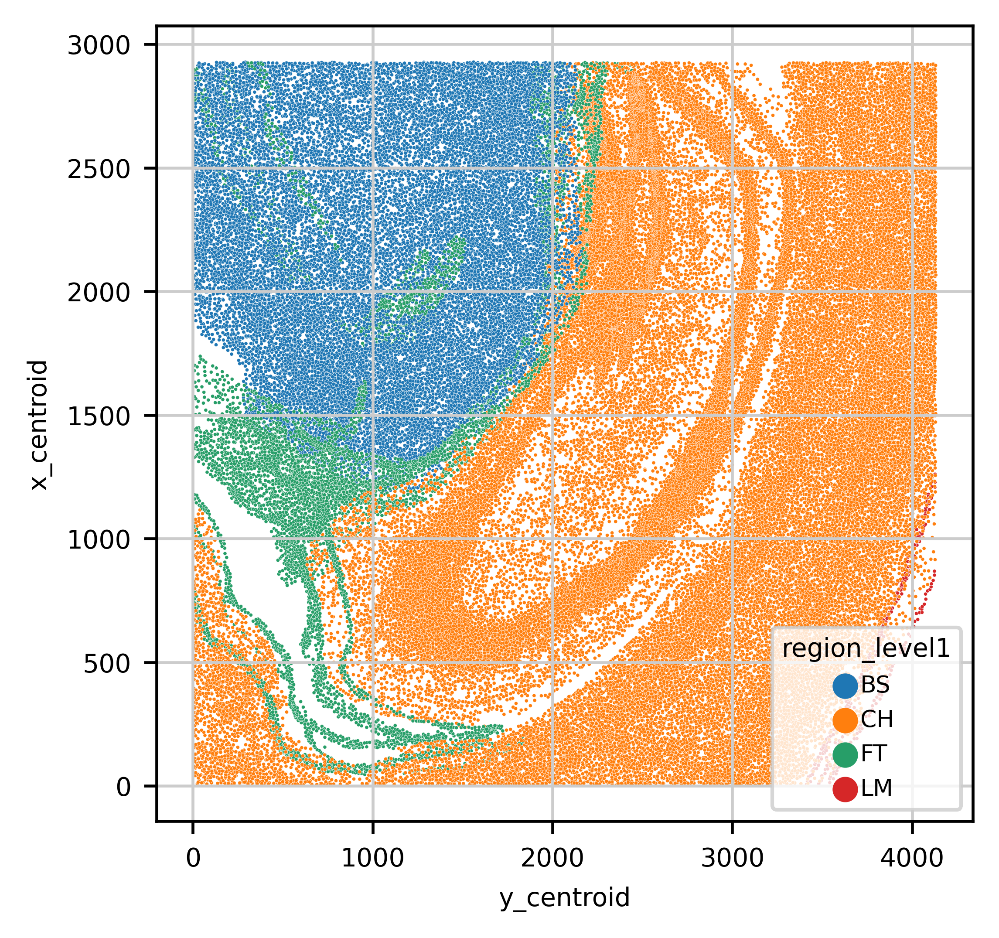

In [184]:
sns.scatterplot(x=adata_dict['xenium'].obs['y_centroid'],y=adata_dict['xenium'].obs['x_centroid'],s=1,hue=adata_dict['xenium'].obs['region_level1'])

# ST

In [196]:
xenium=adata_dict['xenium']

In [201]:
xenium.X=xenium.raw.X

In [202]:
vis=sc.read_visium("../../figures/2.comparison_between_datasets/ST-20221123T102627Z-001/ST/ST_fresh_frozen")

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [203]:
vis.obs

,in_tissue,array_row,array_col
AAACAAGTATCTCCCA-1,1,50,102
AAACAATCTACTAGCA-1,1,3,43
AAACACCAATAACTGC-1,1,59,19
AAACAGAGCGACTCCT-1,1,14,94
AAACCGGGTAGGTACC-1,1,42,28
...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77
TTGTTTCACATCCAGG-1,1,58,42
TTGTTTCATTAGTCTA-1,1,60,30
TTGTTTCCATACAACT-1,1,45,27


In [204]:
ad=sc.read(r"/mnt/c/Users/sergio.salas/Downloads/ST_fresh_frozen.h5ad")
visiumFF=sc.read(r"../../figures/2.comparison_between_datasets/with_regional_anno/anno_ST_FF.h5ad")
subsetad=vis[visiumFF.obs.index]

In [205]:
subsetad.var.index=list([x.lower() for x in subsetad.var.index])

In [206]:
ss=subsetad[:,subsetad.var.index.isin(visiumFF.var.index)]

In [207]:
locdict=dict(zip(visiumFF.obs.index,visiumFF.obs['spatial annotation']))
locdictX=dict(zip(visiumFF.obs.index,visiumFF.obs['x']))
locdictY=dict(zip(visiumFF.obs.index,visiumFF.obs['y']))

In [208]:
ss.obs['spatial annotation']=ss.obs.index.map(locdict)
ss.obs['x']=ss.obs.index.map(locdictX)
ss.obs['y']=ss.obs.index.map(locdictY)

/tmp/ipykernel_98/1114210188.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ss.obs['spatial annotation']=ss.obs.index.map(locdict)
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [209]:
ss.X=ss.X.todense()
visiumFF=ss

<AxesSubplot:xlabel='x', ylabel='y'>

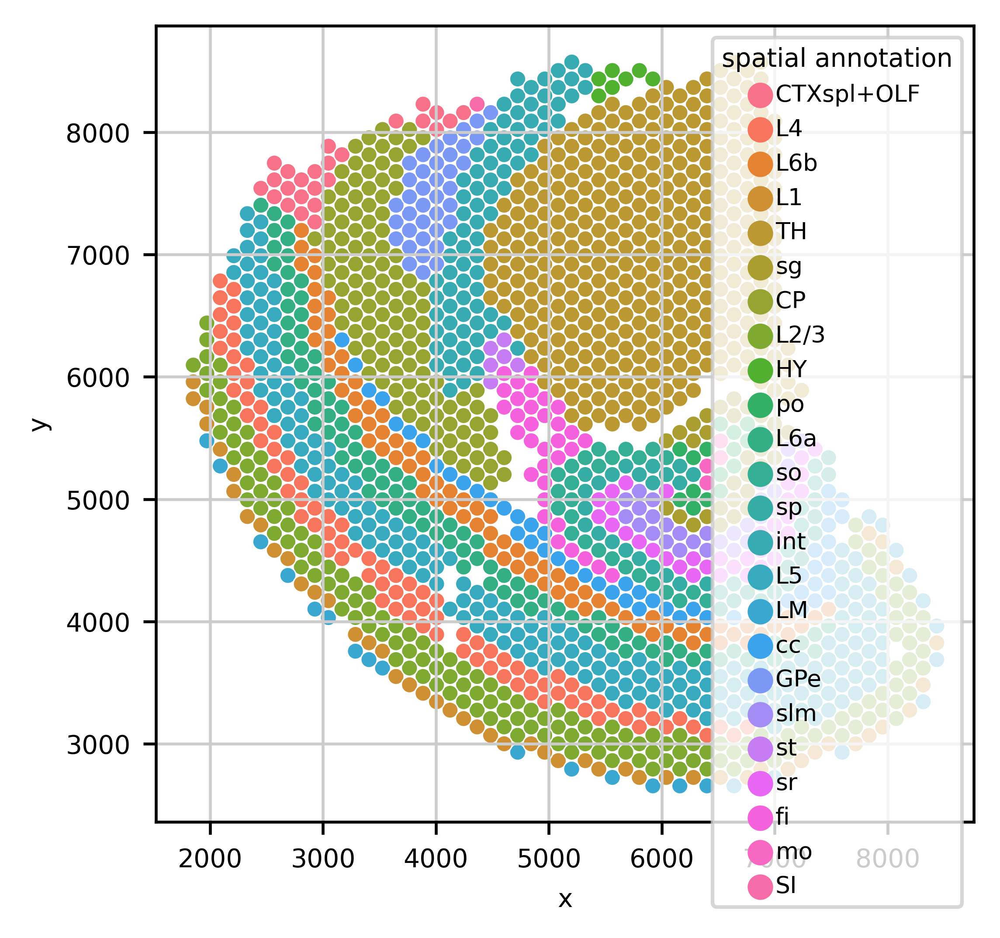

In [210]:
sns.scatterplot(x=visiumFF.obs['x'],y=visiumFF.obs['y'],s=20,hue=visiumFF.obs['spatial annotation'])

In [211]:
regions=['L1','L2/3','L4','L5','L6a','L6b','sp','cc','slm','so','mo','po','sr','sg']

In [212]:
visiumFF=visiumFF[visiumFF.obs['spatial annotation'].isin(regions)]

In [221]:
visiumFF.var.index=list([x.lower() for x in visiumFF.var.index])

<AxesSubplot:xlabel='y', ylabel='x'>

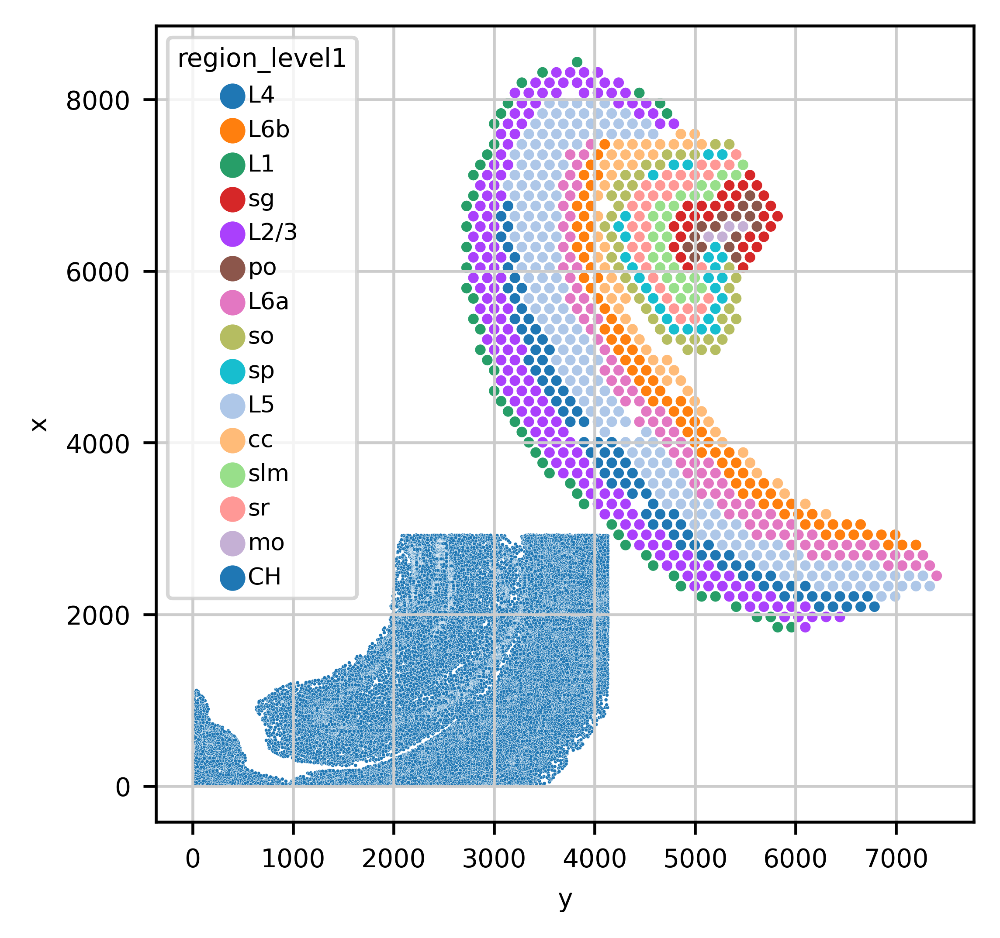

In [222]:
ax=sns.scatterplot(x=visiumFF.obs['y'],y=visiumFF.obs['x'],s=10,hue=visiumFF.obs['spatial annotation'])
sns.scatterplot(x=xenium.obs['y_centroid'],y=xenium.obs['x_centroid'],s=1,hue=xenium.obs['region_level1'],ax=ax)

In [223]:
visiumexpress=pd.DataFrame((visiumFF.X),columns=visiumFF.var.index)

In [224]:
#sc.pp.log1p(xenium)

In [225]:
xeniumexpress=pd.DataFrame((xenium.X),columns=xenium.var.index)

In [226]:
gn=[]
rat=[]
valxen=[]
valvis=[]
for gene in xeniumexpress.columns:
    if gene in visiumexpress.columns:
        t1=np.sum(xeniumexpress.loc[:,gene])
        t2=np.sum(visiumexpress.loc[:,gene])
        valxen.append(t1)
        valvis.append(t2)
        gn.append(gene)
        ratio=t1/t2
        rat.append(ratio)

In [227]:
expre=pd.DataFrame([gn,rat,valxen,valvis],index=['gene','ratio','xenium','visium']).transpose()

In [228]:
expre

,gene,ratio,xenium,visium
0,2010300c02rik,56.589939,119235.0,2107.0
1,acsbg1,9.0,21375.0,2375.0
2,acta2,7.380776,3993.0,541.0
3,acvrl1,39.729168,9535.0,240.0
4,adamts2,23.875648,4608.0,193.0
...,...,...,...,...
278,vwc2l,77.629211,6909.0,89.0
279,wfs1,15.206172,23159.0,1523.0
280,zfp366,57.905659,3069.0,53.0
281,zfp536,48.468254,24428.0,504.0


In [237]:
np.mean(expre['ratio'])

73.34188659452296

In [241]:
np.median(expre['ratio'])

35.305084

In [232]:
xenium.X

array([[0., 0., 0., ..., 0., 2., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 2., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 2.],
       [3., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

/home/sergioms/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/tmp/ipykernel_98/1870493422.py:5: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0,100000)


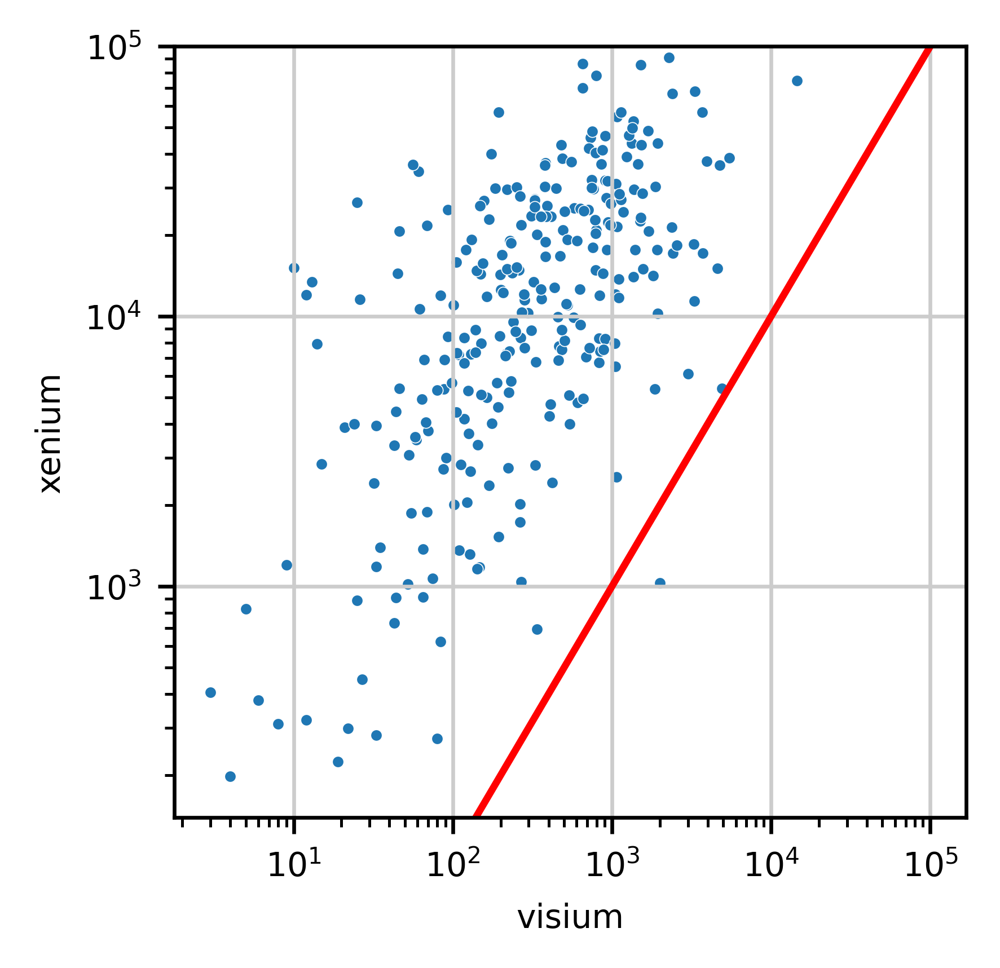

In [236]:
plt.figure(figsize=(3,3))
sns.scatterplot(expre['visium'],expre['xenium'],s=6)
plt.xscale('log')
plt.yscale('log')
plt.ylim(0,100000)
#plt.ylim(bottom=0)
x = np.linspace(0,100000)
y = 1*x
plt.plot(x, y,'-r')
plt.savefig('../../figures/2.comparison_between_datasets/visiumFF_vs_Xenium.pdf')


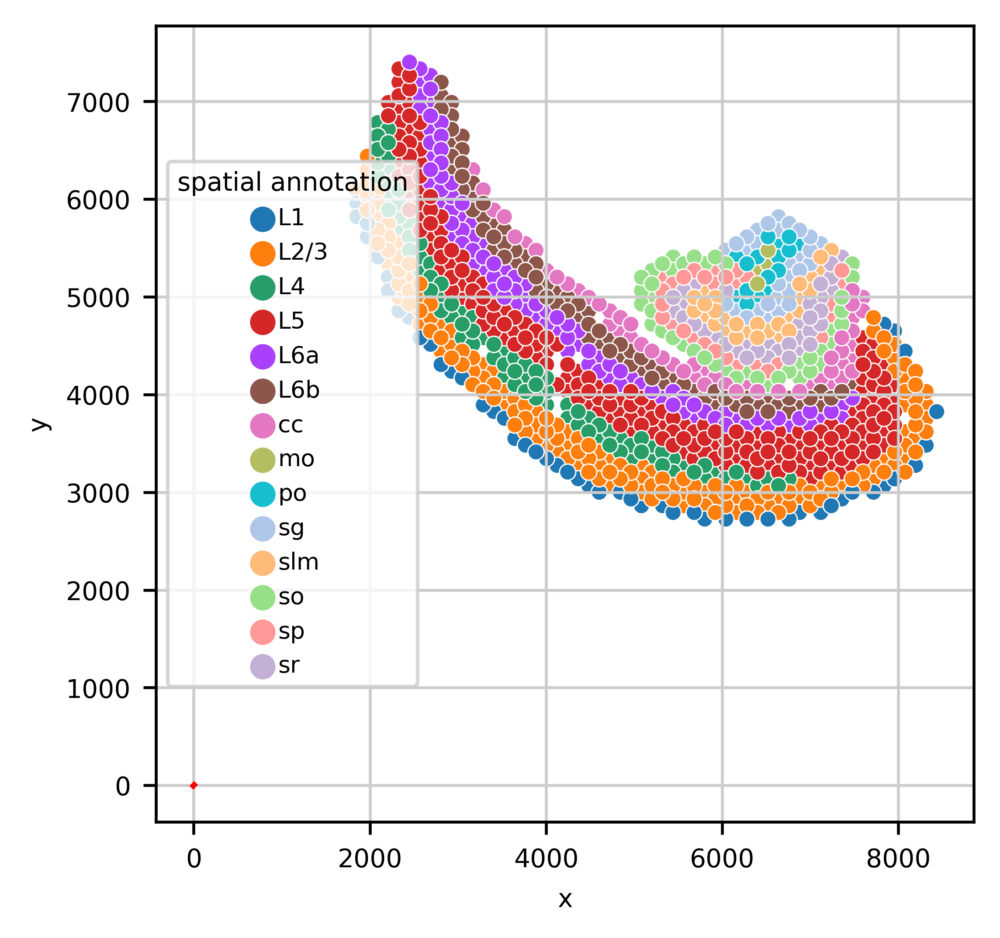

In [45]:
sns.scatterplot(x=visiumFF.obs['x'],y=visiumFF.obs['y'],s=20,hue=visiumFF.obs['spatial annotation'])


In [240]:
xenium=adata_dict['xenium']

In [328]:
xenium

AnnData object with n_obs × n_vars = 49773 × 284
    obs: 'ind', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'graph_clusters', 'kmeans2_clusters', 'kmeans3_clusters', 'kmeans4_clusters', 'kmeans5_clusters', 'kmeans6_clusters', 'kmeans7_clusters', 'kmeans8_clusters', 'kmeans9_clusters', 'kmeans10_clusters', 'sample_id', 'n_counts', 'leiden_2_2', 'leiden_1_8', 'leiden_1_4', 'leiden_1_0', 'leiden_0_8', 'leiden_0_6', 'cell_code', 'expanded_class', 'expanded_initial_annotation', 'Class', 'initial_annotation', 'celltype_annotation', 'X', 'Y', 'leiden_0_4', 'leiden_0_2', 'Class_old', 'class_number', 'spatial annotation', 'region_level1', 'n_genes_by_counts'
    var: 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    obsm: 'X_pca', 'X_umap', 'spatial'
    layers: 'raw'

In [329]:
ad=sc.read(r"/mnt/c/Users/sergio.salas/Downloads/ST_fresh_frozen.h5ad")
visiumFF=sc.read(r"../../figures/2.comparison_between_datasets/with_regional_anno/anno_ST_FF.h5ad")
subsetad=ad[visiumFF.obs.index]

In [292]:
ad.X

<2691x17514 sparse matrix of type '<class 'numpy.float32'>'
	with 15906222 stored elements in Compressed Sparse Row format>